In [1]:
#required imports
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
#turning parquet file into a csv file in order to use the existing code frameworks
pd = pd.read_parquet('/Users/defne/Desktop/daily_averages.parquet', engine='pyarrow')
pd_csv = pd.to_csv('parquet_to_csv.csv')

In [ ]:
#collection of the path names for simplicity
'parquet_to_csv.csv'
'/Users/defne/Desktop/Current_data_subset/ITALY_2_CONSOLIDATED.xlsx'
'/Users/defne/Desktop/Current_data_subset/ITALY_CONSOLIDATED.xlsx'
'/Users/defne/Desktop/Current_data_subset/FRANCE_JL_IONS_CONSOLIDATED_new.xlsx'
'/Users/defne/Desktop/Current_data_subset/GERMANY_CONSOLIDATED_FINAL.xlsx'
'/Users/defne/Desktop/Current_data_subset/GREECE_CONSOLIDATED_WITH_ACSM_new.xlsx'
'/Users/defne/Desktop/Current_data_subset/MISC_CONSOLIDATED_15_09_2023_new.xlsx'
'/Users/defne/Desktop/Current_data_subset/PORTUGAL_CONSOLIDATED.xlsx'
'/Users/defne/Desktop/Current_data_subset/SLOVENIA_CONSOLIDATED.xlsx'
'/Users/defne/Desktop/Current_data_subset/SPAIN_CONSOLIDATED.xlsx'
'/Users/defne/Desktop/Current_data_subset/SWITZERLAND_CONSOLIDATED_new.xlsx'

# Time Series

In [11]:

def plot_time_series(csv_file_path, excel_file_path):
    # Load the CSV file and skip the first column (contains only the index)
    df_csv = pd.read_csv(csv_file_path, usecols=range(1, 8), parse_dates=['Date'])

    # Drop rows where NO3 or SO4 are missing or a space
    df_csv = df_csv[(df_csv['NO3'] != ' ') & (df_csv['SO4'] != ' ')]
    df_csv.dropna(subset=['NO3', 'SO4'], inplace=True)

    df_csv['Date'] = pd.to_datetime(df_csv['Date']).dt.date
    df_csv['Date'] = pd.to_datetime(df_csv['Date'])  # Convert to datetime64[ns]

    # Group by date and station_id and then take the mean for NO3 and SO4
    df_grouped = df_csv.groupby(['Date', 'station_id']).agg({'NO3': 'mean', 'SO4': 'mean'}).reset_index()

    # Load Excel file
    xl = pd.ExcelFile(excel_file_path)

    for sheet in xl.sheet_names:
        df_sheet = xl.parse(sheet, skiprows=[1])  # Skipping the second row with IDs

        # Check if 'NO3-' and 'SO42-' columns exist, if not skip to next sheet
        if 'NO3-' not in df_sheet.columns or 'SO42-' not in df_sheet.columns:
            continue

        # Convert 'Date' to datetime64[ns], specifying the correct format
        df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], format='%d.%m.%Y')

        # Convert 'NO3-' and 'SO42-' to numeric, coerce errors
        df_sheet['NO3-'] = pd.to_numeric(df_sheet['NO3-'], errors='coerce')
        df_sheet['SO42-'] = pd.to_numeric(df_sheet['SO42-'], errors='coerce')

        # Extract the ID in the second row of the Station Name column
        id_excel = xl.parse(sheet, nrows=2).iloc[1, 0]

        # Filter records from the grouped CSV DataFrame based on ID
        df_filtered = df_grouped[df_grouped['station_id'] == id_excel]

        # Merge based on Date
        df_merged = pd.merge(df_filtered, df_sheet, how='inner', left_on='Date', right_on='Date')

        # Drop rows with NaN in 'NO3-' or 'SO42-'
        df_merged.dropna(subset=['NO3-', 'SO42-'], inplace=True)

        # Create separate DataFrames for SO4 and NO3
        df_SO4 = df_merged[['Date', 'SO4', 'SO42-']].copy()
        df_NO3 = df_merged[['Date', 'NO3', 'NO3-']].copy()

        # Extract PM info from the sheet name
        pm_info = xl.parse(sheet, nrows=2).iloc[0, 5]

        # Create subplot for time series plots
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 6))

        # Time series plot for SO4
        ax1.plot(df_SO4['Date'], df_SO4['SO4'], label='Model SO4', color='b')
        ax1.plot(df_SO4['Date'], df_SO4['SO42-'], label='Measurement SO4', color='g')
        ax1.legend()
        ax1.set_title(f'Time Series for SO4 - ID {id_excel} ({pm_info})')
        ax1.set_xlabel('Date')
        ax1.set_ylabel('Concentration')

        # Time series plot for NO3
        ax2.plot(df_NO3['Date'], df_NO3['NO3'], label='Model NO3', color='r')
        ax2.plot(df_NO3['Date'], df_NO3['NO3-'], label='Measurement NO3', color='c')
        ax2.legend()
        ax2.set_title(f'Time Series for NO3 - ID {id_excel} ({pm_info})')
        ax2.set_xlabel('Date')
        ax2.set_ylabel('Concentration')

        plt.show()


# Scatter Plot

In [12]:
def plot_scatter_plots(csv_file_path, excel_file_path):
    
    # Load the CSV file and skip the first column (contains only the index)
    df_csv = pd.read_csv(csv_file_path, usecols=range(1, 8), parse_dates=['Date'])

    # Drop rows where NO3 or SO4 are missing or a space
    df_csv = df_csv[(df_csv['NO3'] != ' ') & (df_csv['SO4'] != ' ')]
    df_csv.dropna(subset=['NO3', 'SO4'], inplace=True)

    df_csv['Date'] = pd.to_datetime(df_csv['Date']).dt.date
    df_csv['Date'] = pd.to_datetime(df_csv['Date'])  # Convert to datetime64[ns]

    # Group by date and station_id and then take the mean for NO3 and SO4
    df_grouped = df_csv.groupby(['Date', 'station_id']).agg({'NO3': 'mean', 'SO4': 'mean'}).reset_index()

    # Load Excel file
    xl = pd.ExcelFile(excel_file_path)

    for sheet in xl.sheet_names:
        df_sheet = xl.parse(sheet, skiprows=[1])  # Skipping the second row with IDs

        # Check if 'NO3-' and 'SO42-' columns exist, if not skip to next sheet
        if 'NO3-' not in df_sheet.columns or 'SO42-' not in df_sheet.columns:
            continue

        df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]

        # Convert 'NO3-', 'SO42-' to numeric, coerce errors
        df_sheet['NO3-'] = pd.to_numeric(df_sheet['NO3-'], errors='coerce')
        df_sheet['SO42-'] = pd.to_numeric(df_sheet['SO42-'], errors='coerce')

        # Extract the ID in the second row of the Station Name column
        id_excel = xl.parse(sheet, nrows=2).iloc[1, 0]

        # Extract PM info from the 6th column, first row (after the column name)
        pm_info = xl.parse(sheet, nrows=2).iloc[0, 5]

        # Filter records from the grouped CSV DataFrame based on ID
        df_filtered = df_grouped[df_grouped['station_id'] == id_excel]

        # Merge based on Date
        df_merged = pd.merge(df_filtered, df_sheet, how='inner', left_on='Date', right_on='Date')

        # Drop rows with NaN in 'NO3-' or 'SO42-'
        df_merged.dropna(subset=['NO3-', 'SO42-'], inplace=True)

        # Create separate DataFrames for SO4 and NO3
        df_SO4 = df_merged[['Date', 'SO4', 'SO42-']].copy()
        df_NO3 = df_merged[['Date', 'NO3', 'NO3-']].copy()

        # Create subplot for scatter plots
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 6))

        # Scatter plot for SO4
        ax1.scatter(df_SO4['SO4'], df_SO4['SO42-'], color='b', alpha=0.5, label='SO4')
        ax1.set_title(f'Scatter Plot for SO4 - ID {id_excel} ({pm_info})')
        ax1.set_xlabel('Model SO4')
        ax1.set_ylabel('Measurement SO4')
        ax1.legend()

        # Scatter plot for NO3
        ax2.scatter(df_NO3['NO3'], df_NO3['NO3-'], color='r', alpha=0.5, label='NO3')
        ax2.set_title(f'Scatter Plot for NO3 - ID {id_excel} ({pm_info})')
        ax2.set_xlabel('Model NO3')
        ax2.set_ylabel('Measurement NO3')
        ax2.legend()

        plt.show()


# Italy 

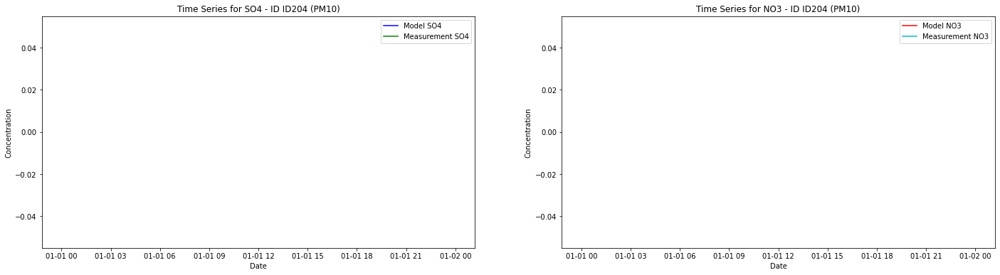

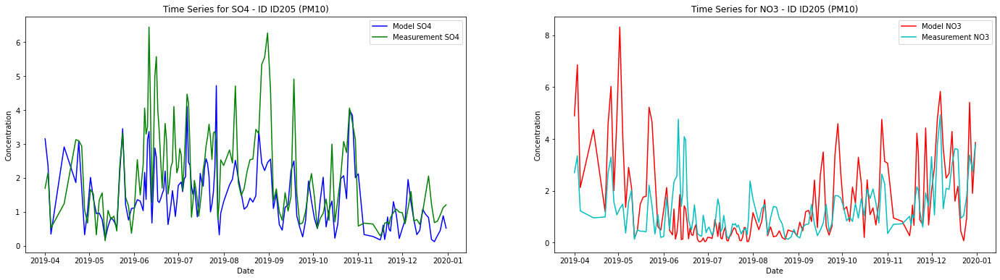

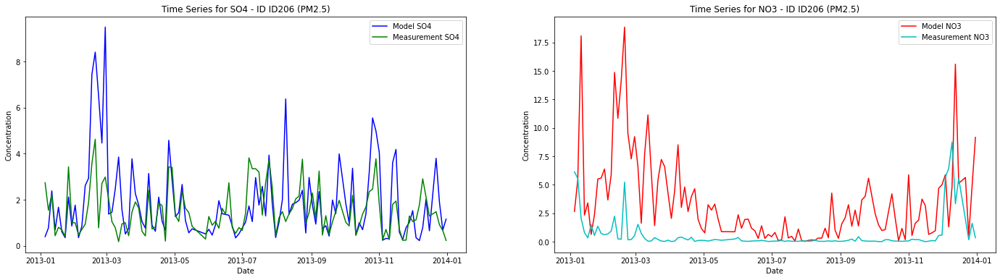

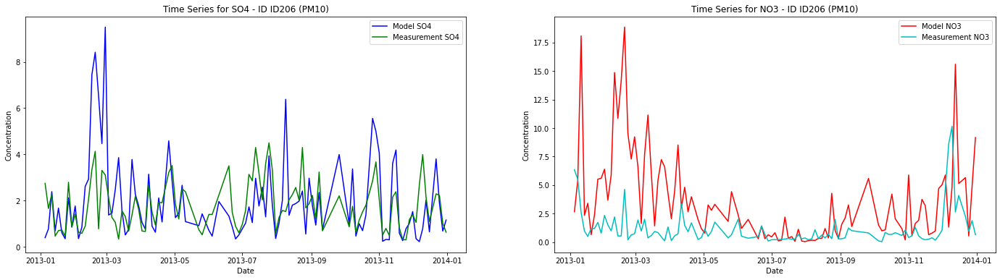

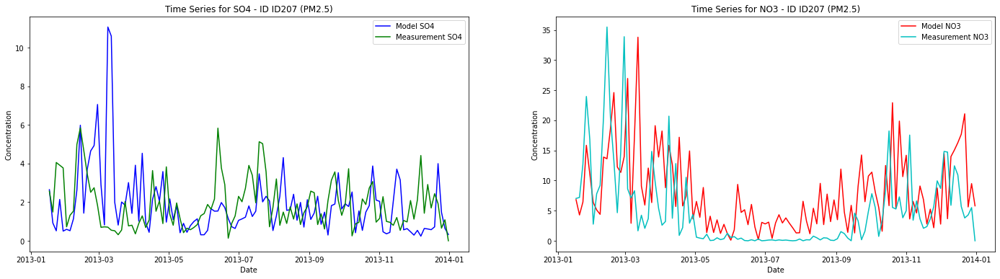

...

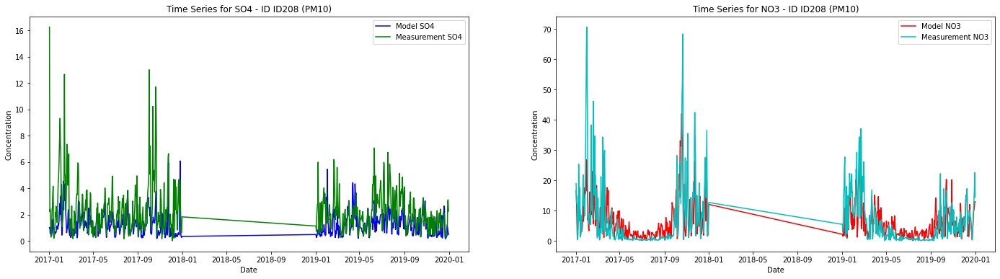

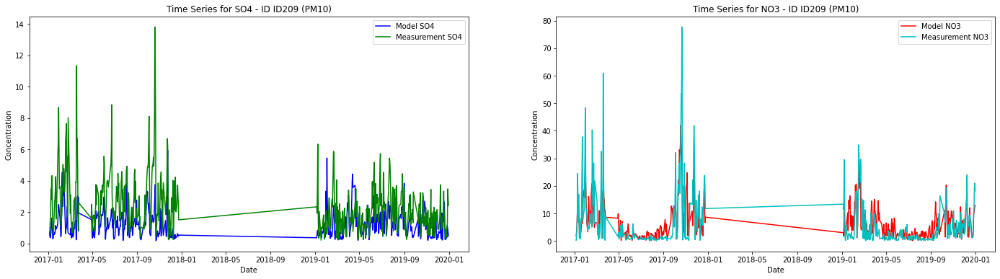

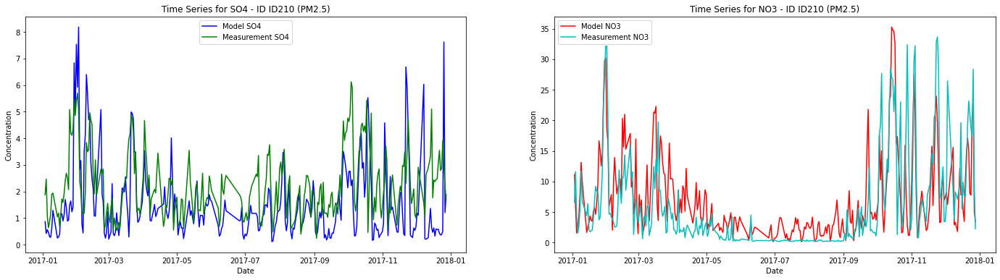

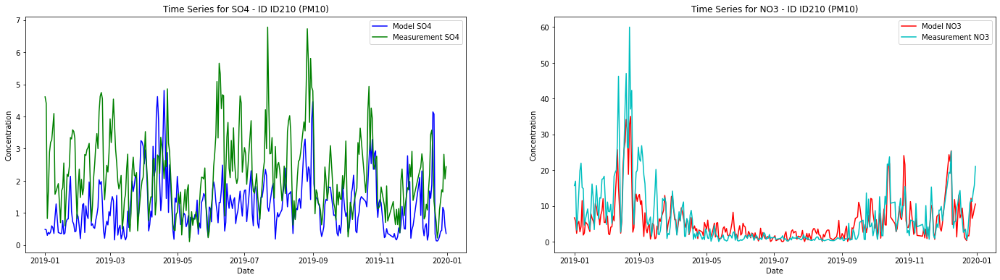

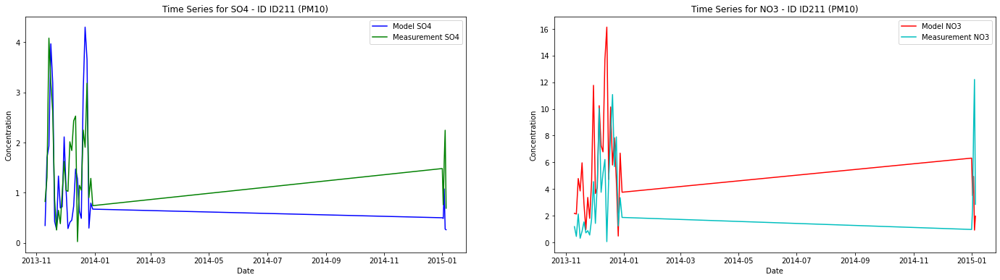

In [13]:
plot_time_series('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/ITALY_CONSOLIDATED.xlsx' )

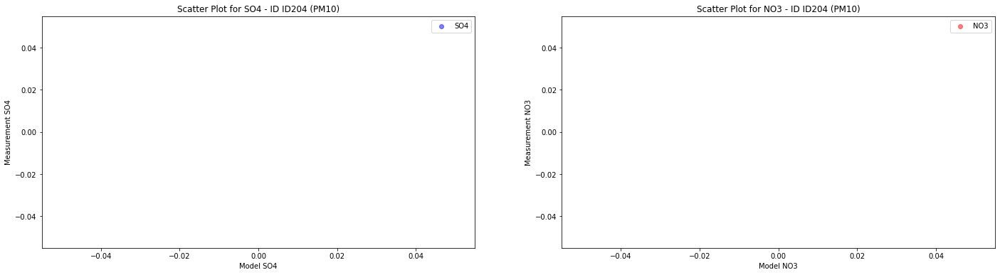

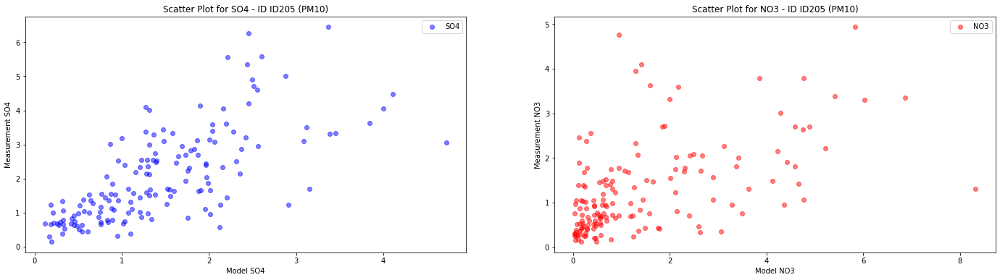

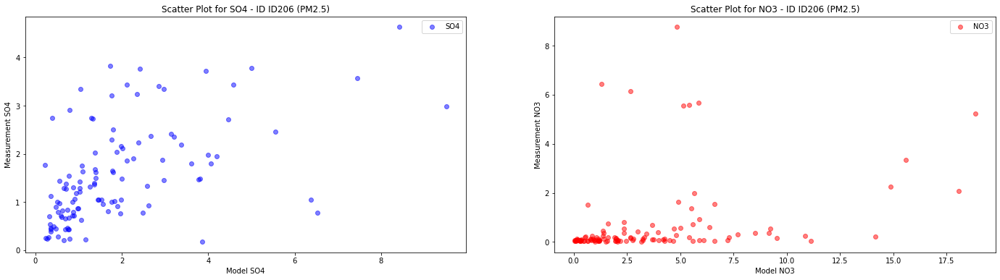

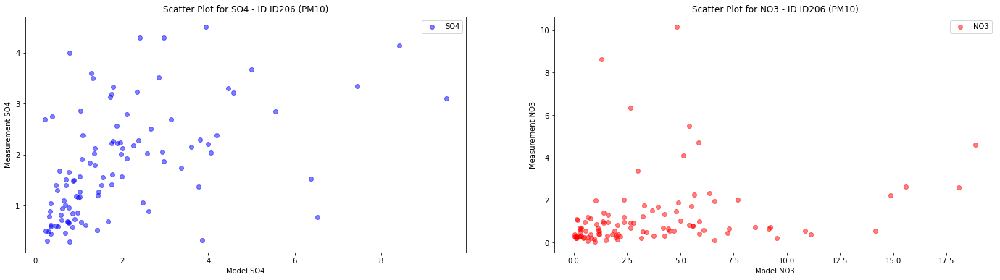

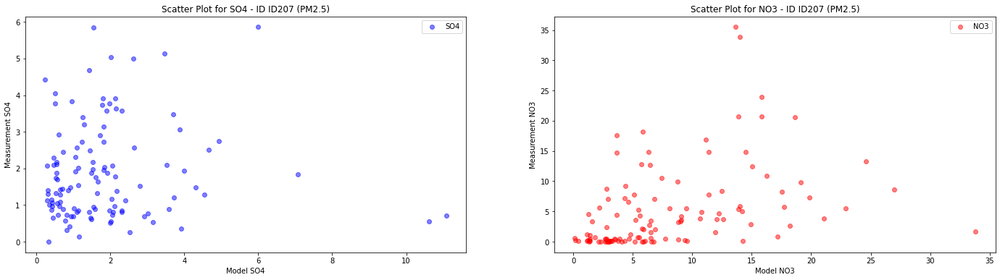

...

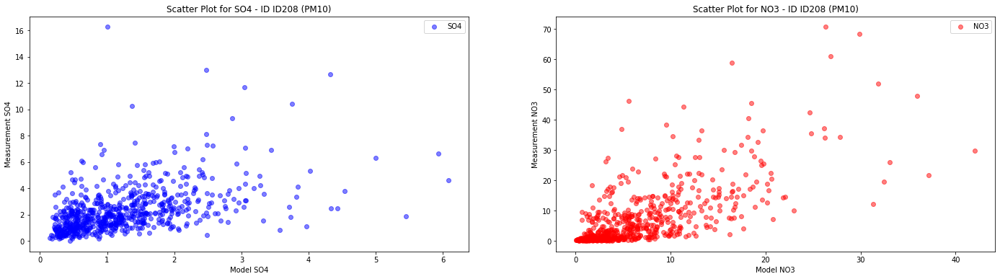

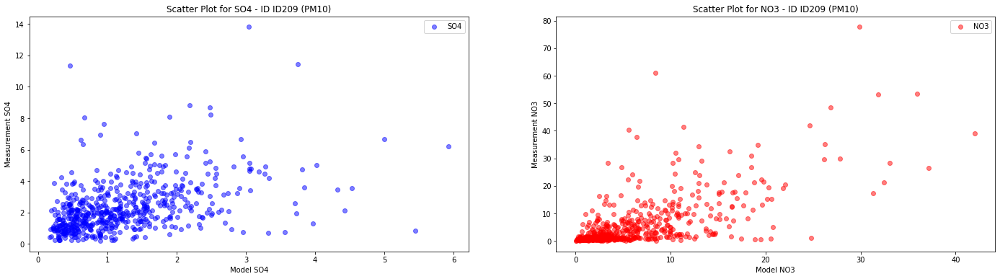

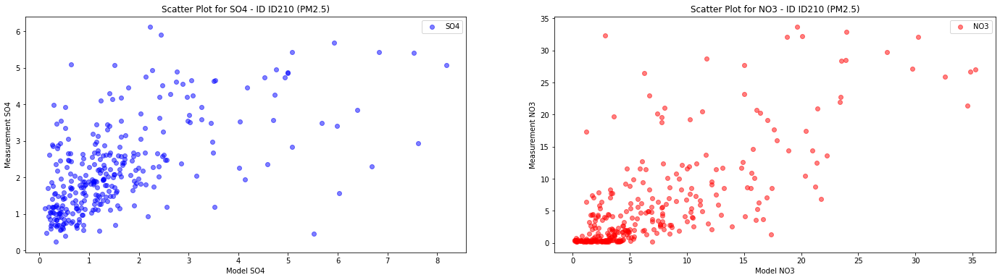

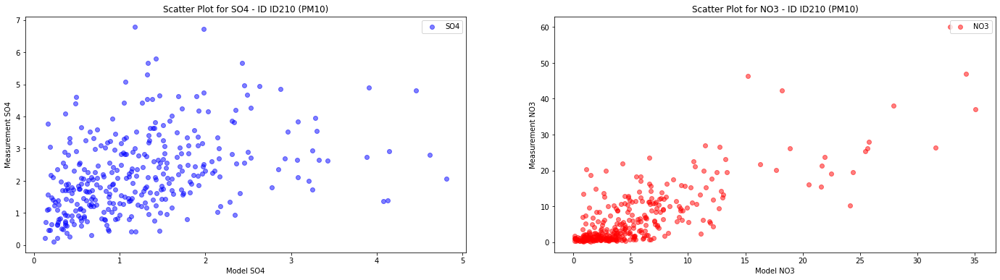

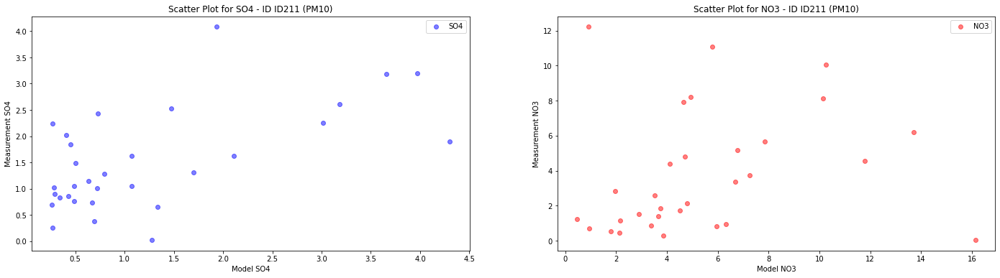

In [14]:
plot_scatter_plots('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/ITALY_CONSOLIDATED.xlsx')

# Italy 2

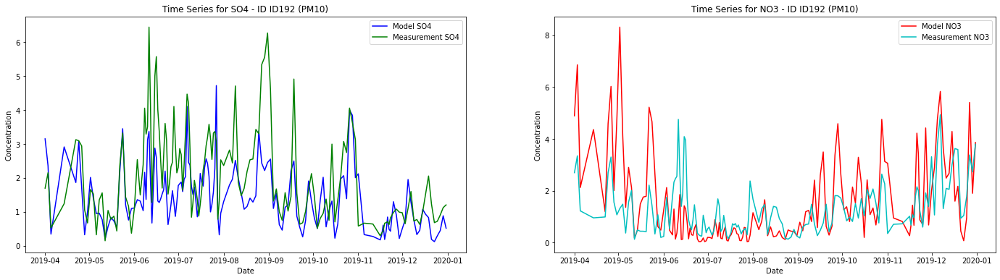

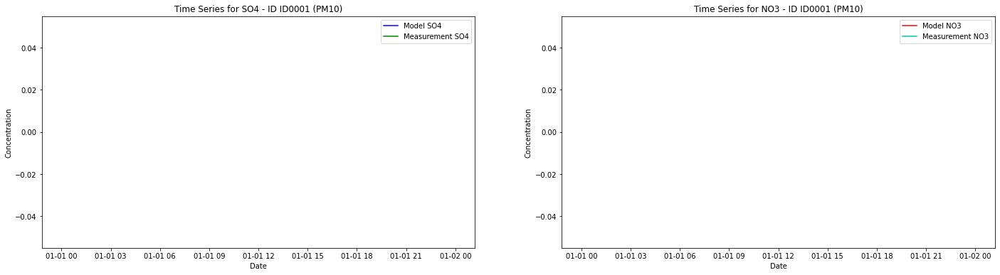

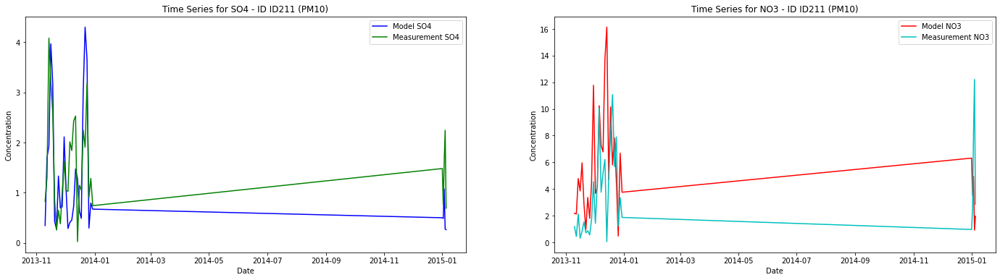

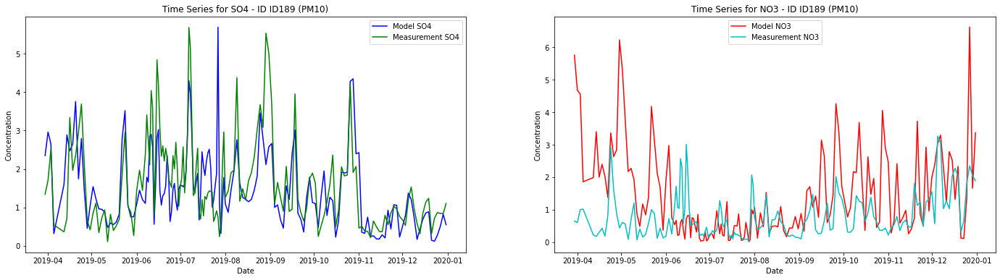

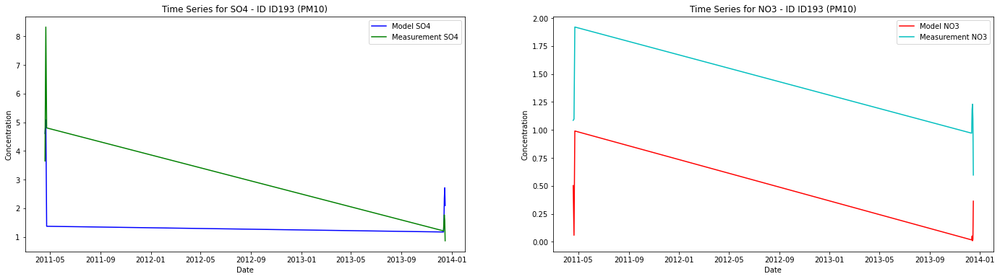

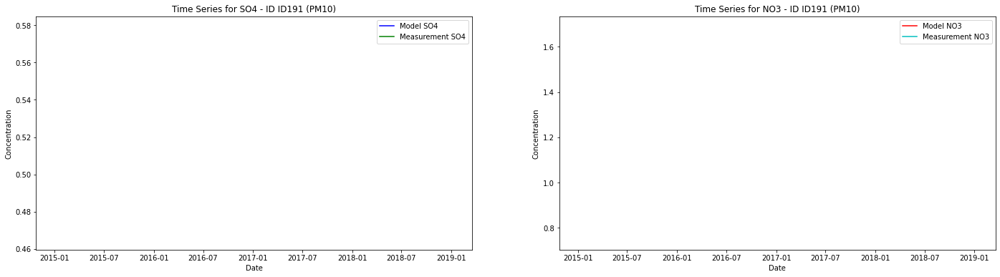

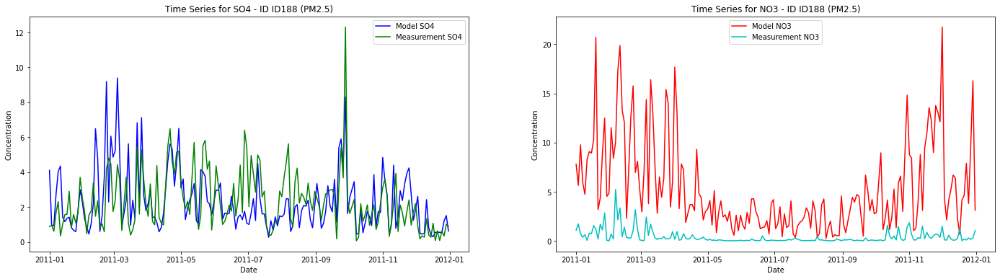

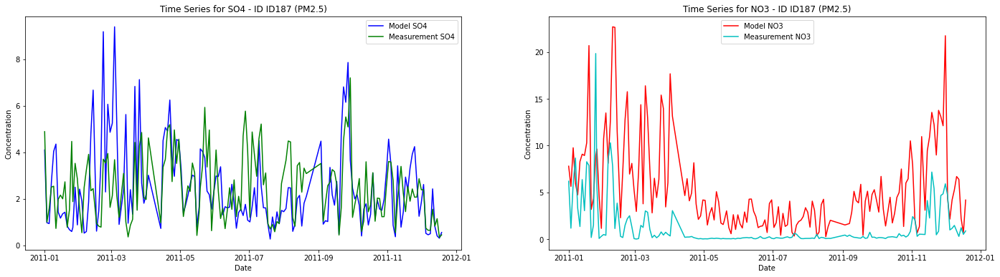

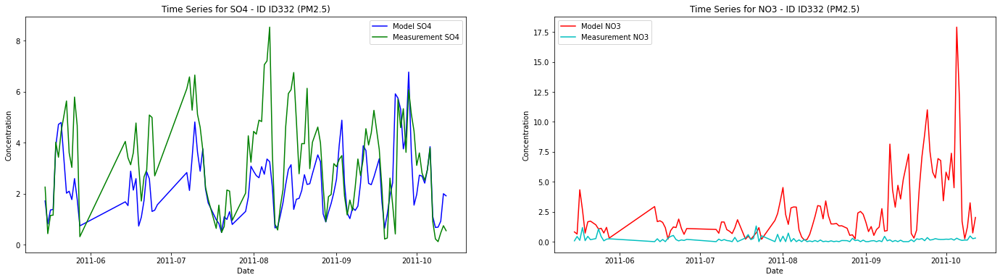

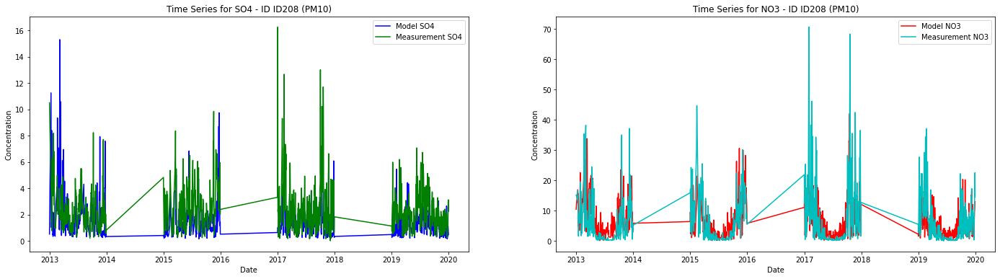

In [15]:
plot_time_series('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/ITALY_2_CONSOLIDATED.xlsx')

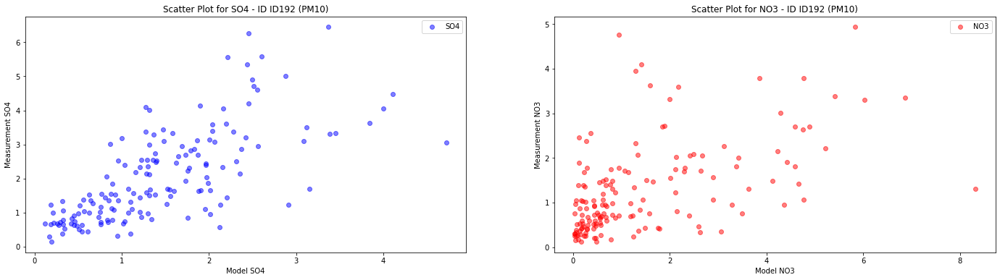

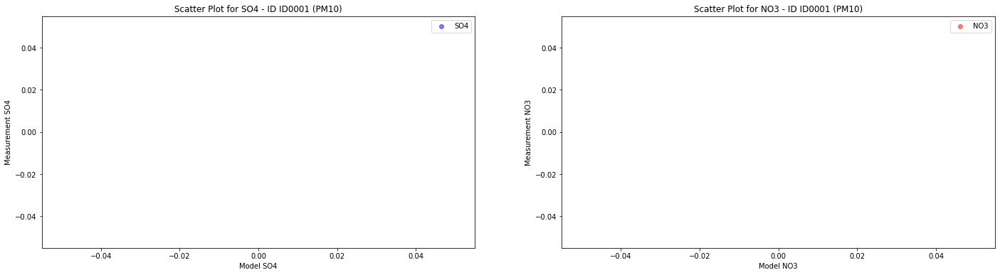

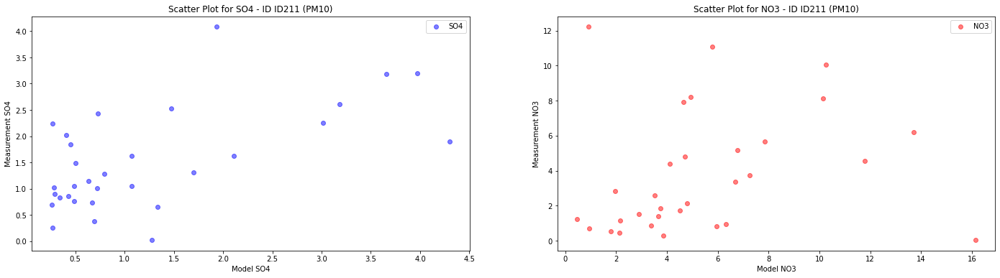

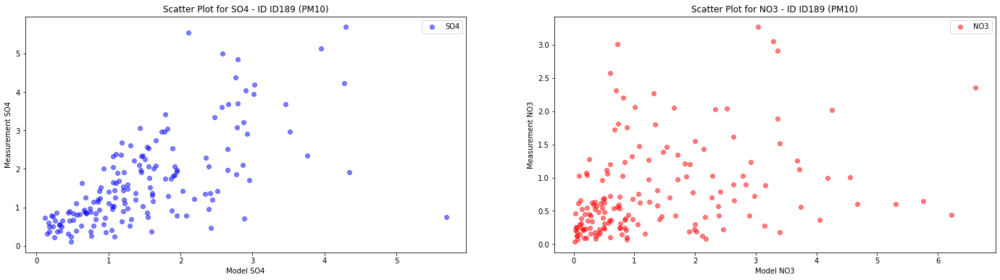

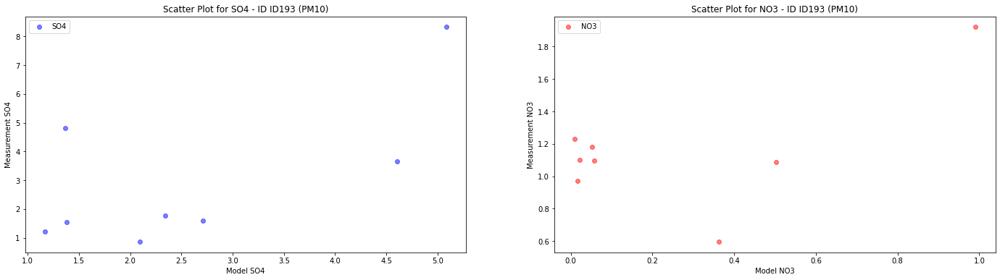

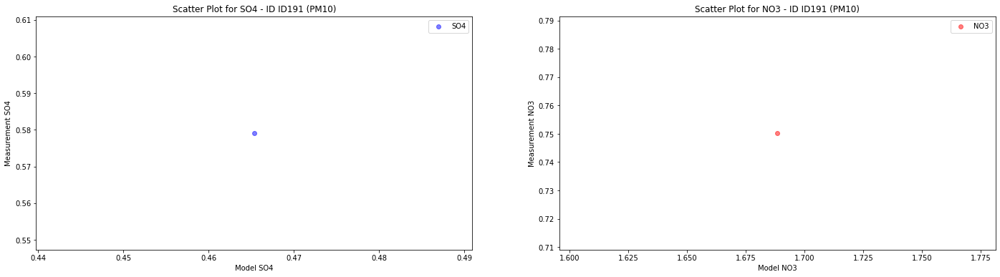

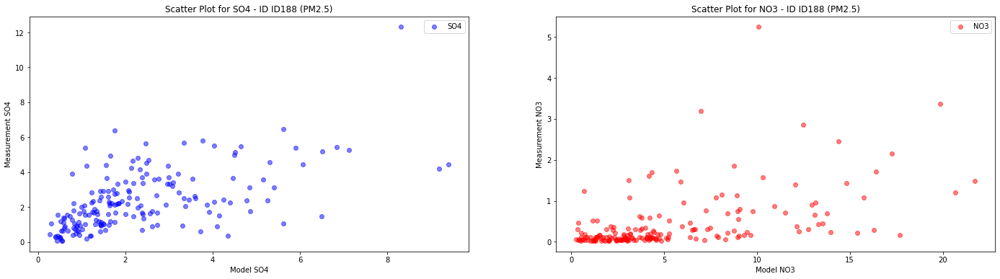

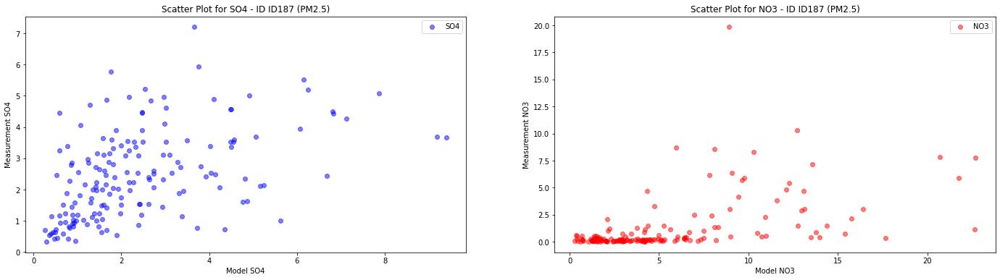

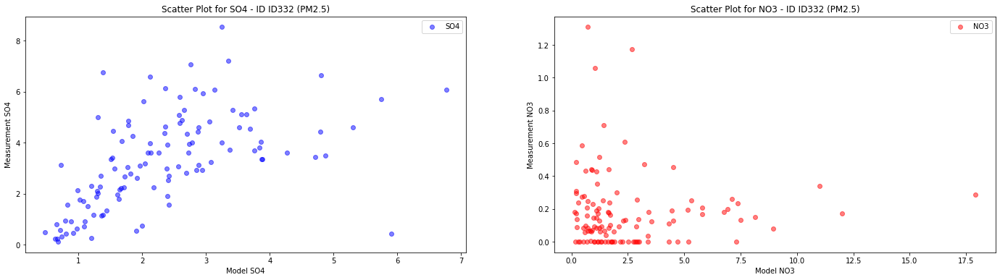

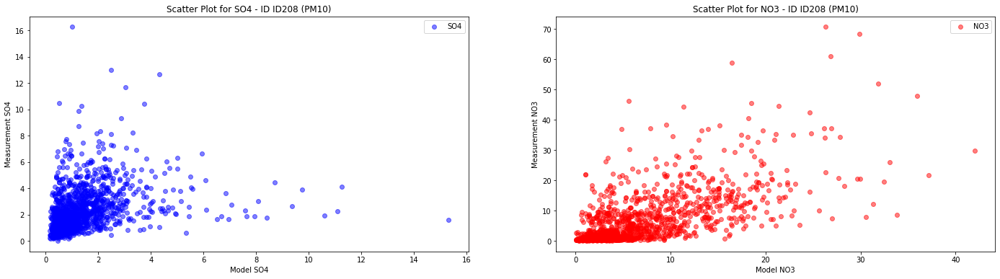

In [16]:
plot_scatter_plots('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/ITALY_2_CONSOLIDATED.xlsx')

# France

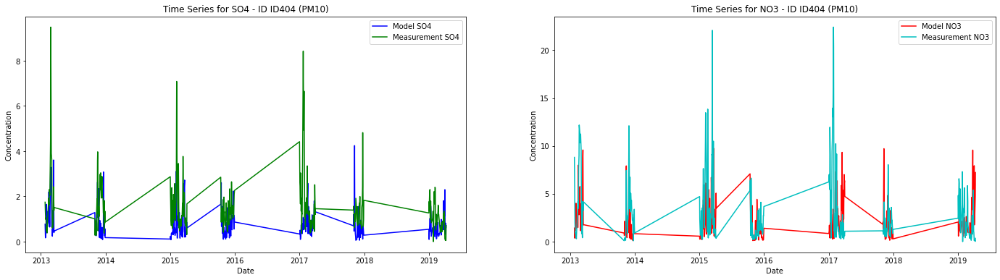

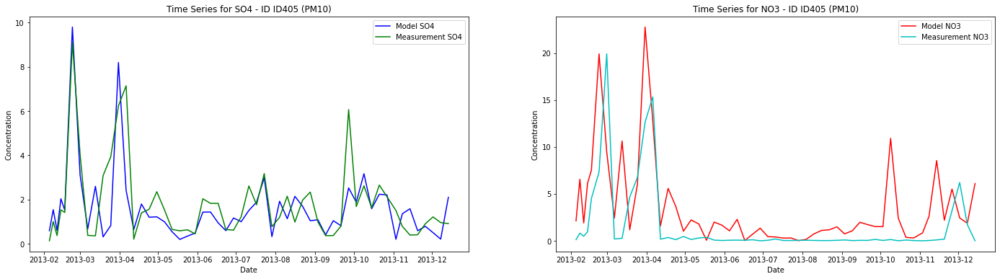

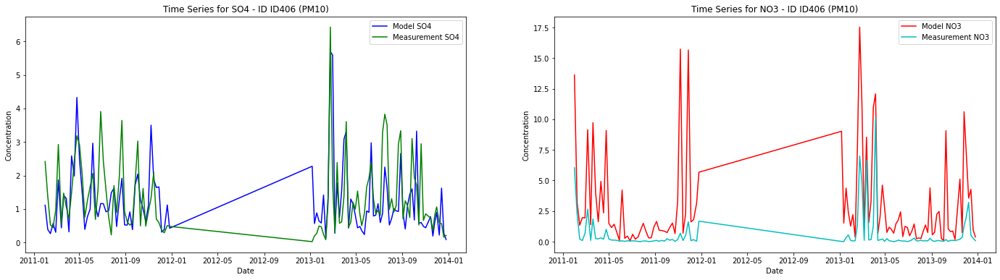

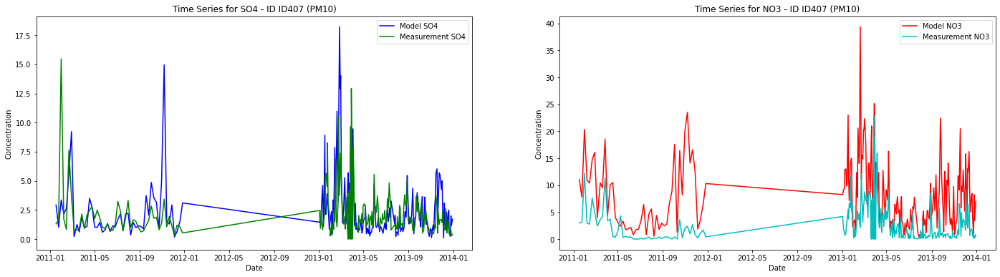

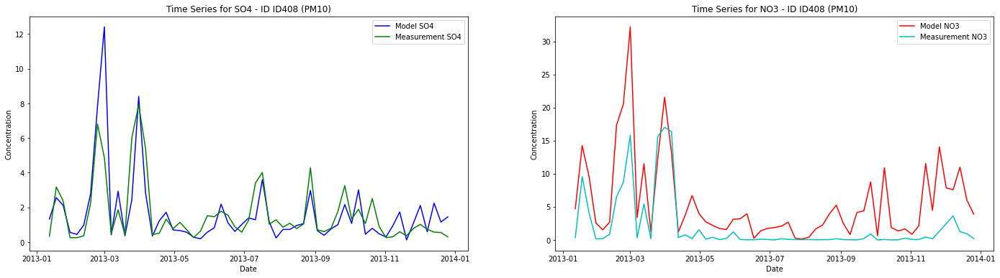

...

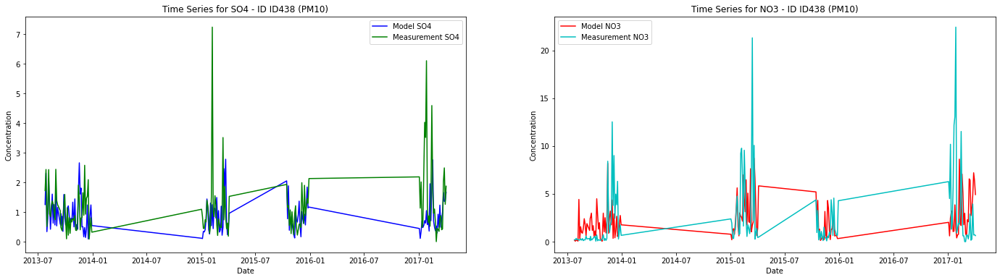

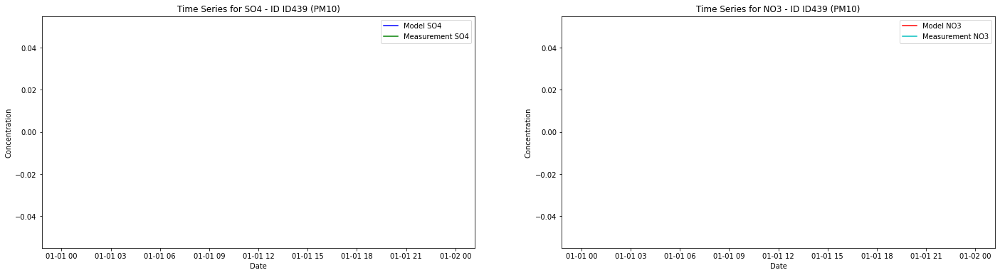

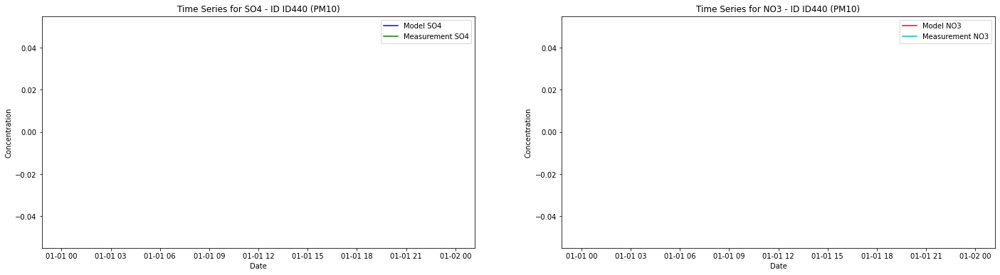

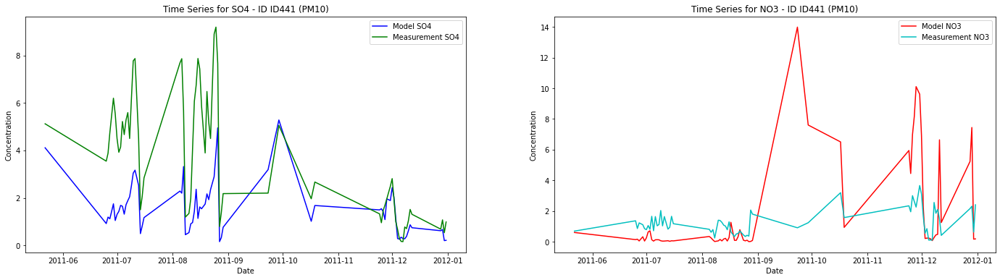

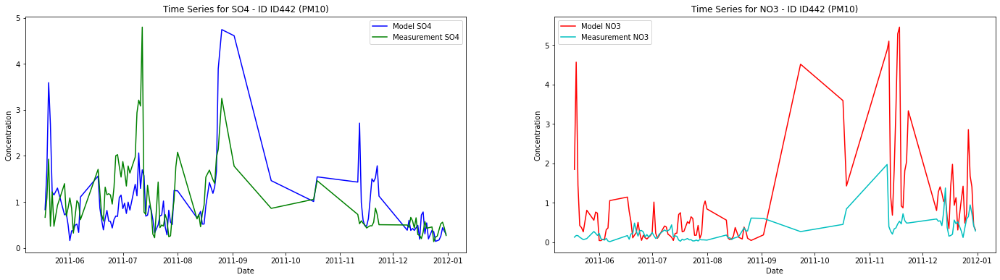

In [17]:
plot_time_series('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/FRANCE_JL_IONS_CONSOLIDATED_new.xlsx')

/var/folders/fs/9hkffwc95yz53x44d27zb2ym0000gn/T/ipykernel_21207/1045416388.py:26: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]


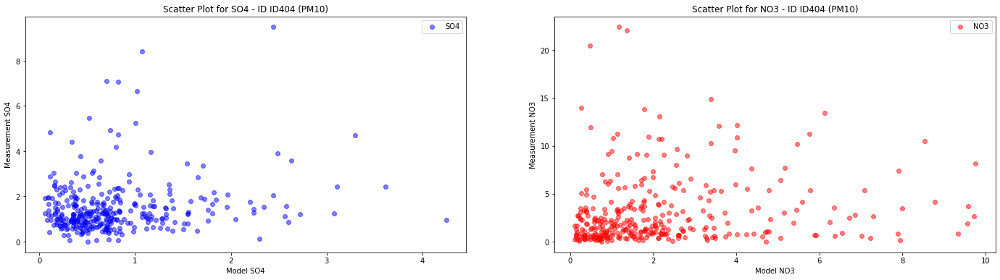

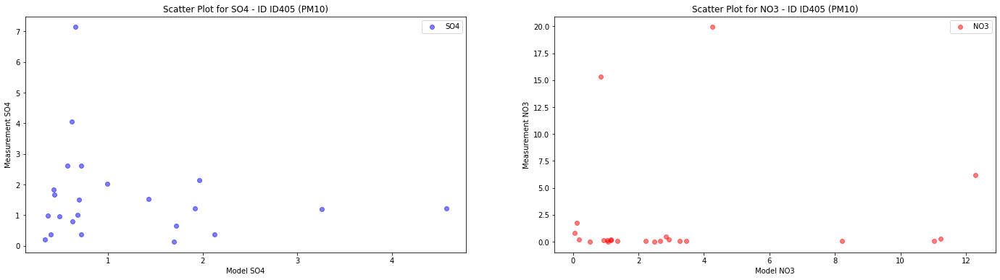

/var/folders/fs/9hkffwc95yz53x44d27zb2ym0000gn/T/ipykernel_21207/1045416388.py:26: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]


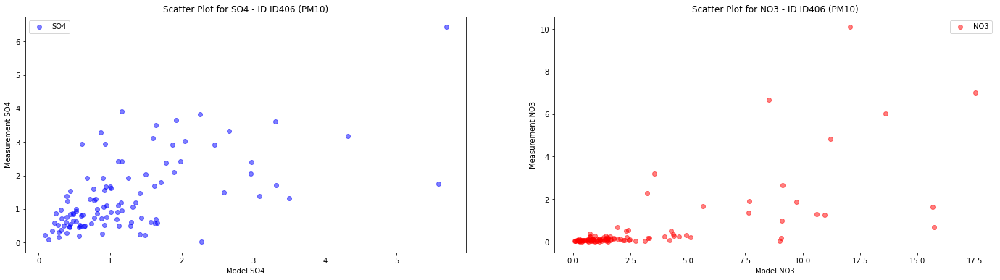

/var/folders/fs/9hkffwc95yz53x44d27zb2ym0000gn/T/ipykernel_21207/1045416388.py:26: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]


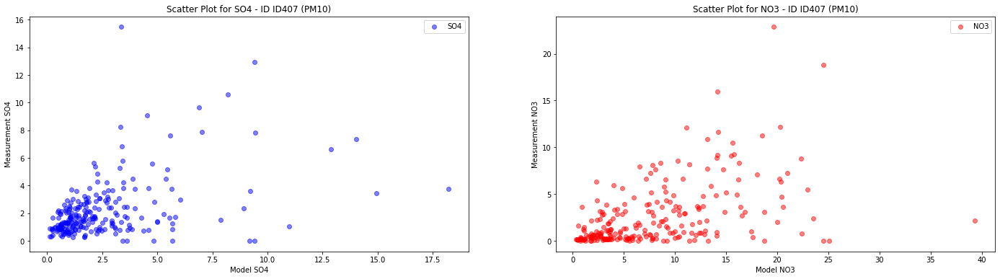

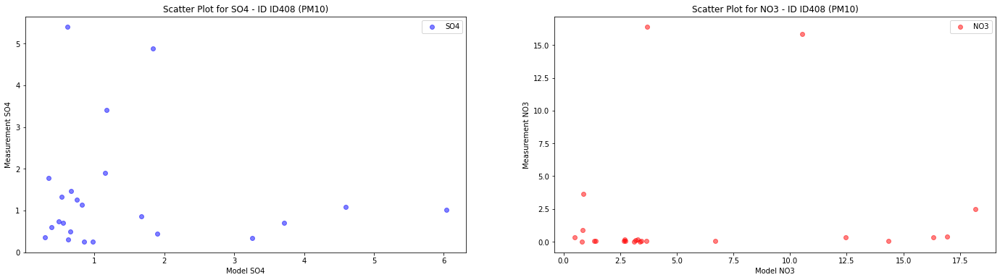

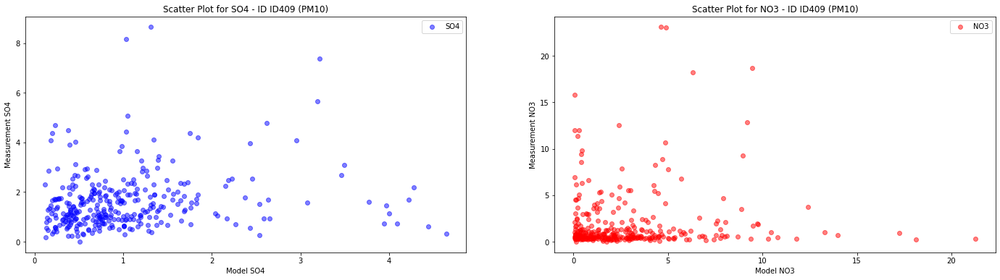

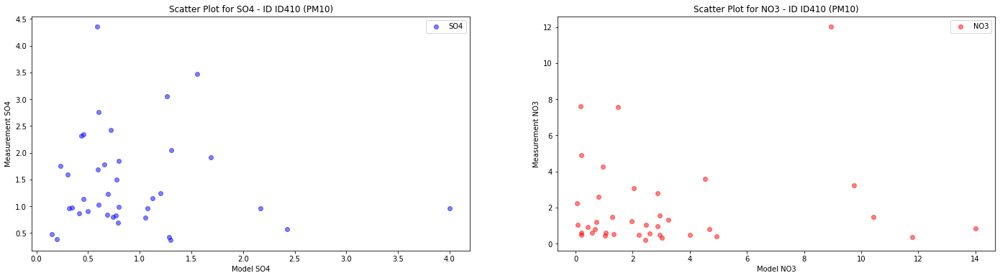

/var/folders/fs/9hkffwc95yz53x44d27zb2ym0000gn/T/ipykernel_21207/1045416388.py:26: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]


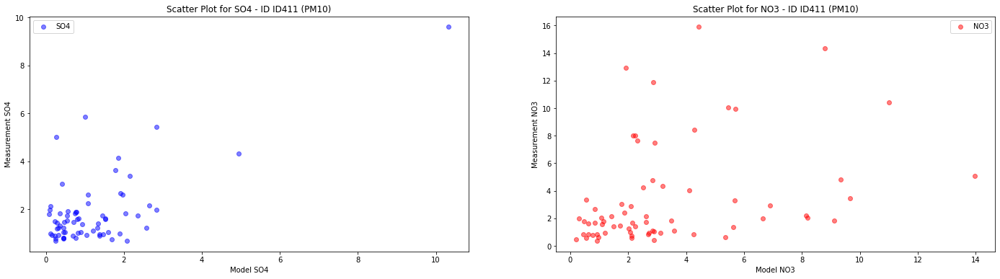

/var/folders/fs/9hkffwc95yz53x44d27zb2ym0000gn/T/ipykernel_21207/1045416388.py:26: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]


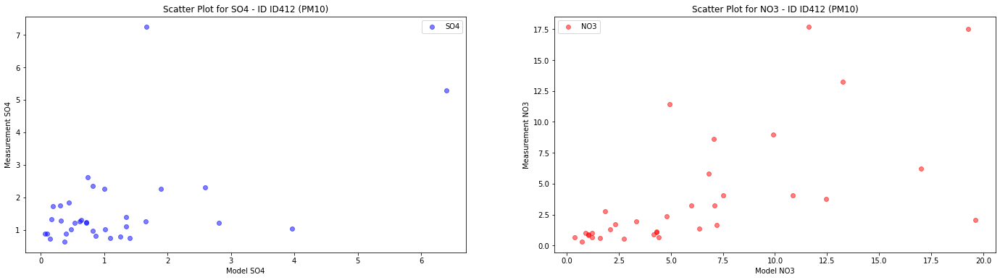

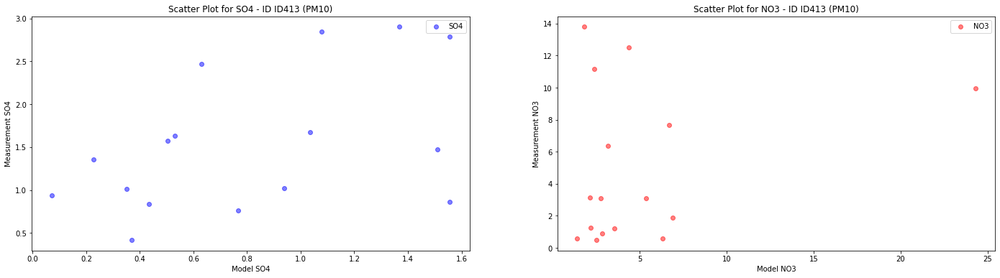

/var/folders/fs/9hkffwc95yz53x44d27zb2ym0000gn/T/ipykernel_21207/1045416388.py:26: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]


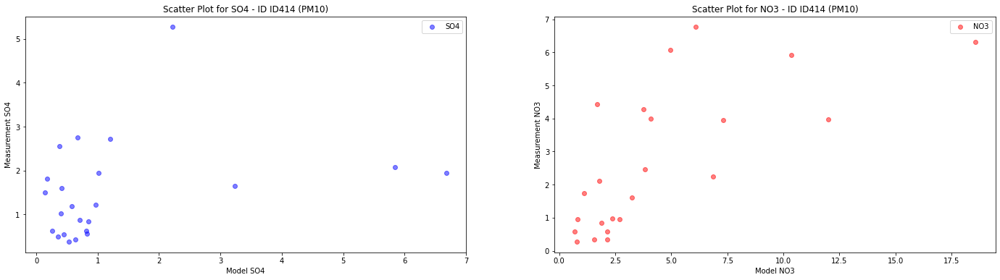

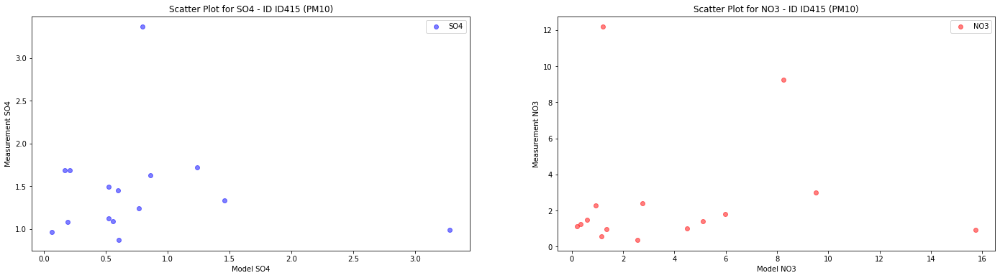

/var/folders/fs/9hkffwc95yz53x44d27zb2ym0000gn/T/ipykernel_21207/1045416388.py:26: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]


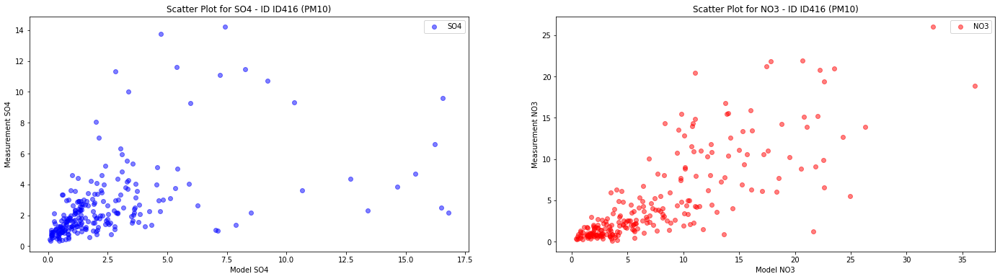

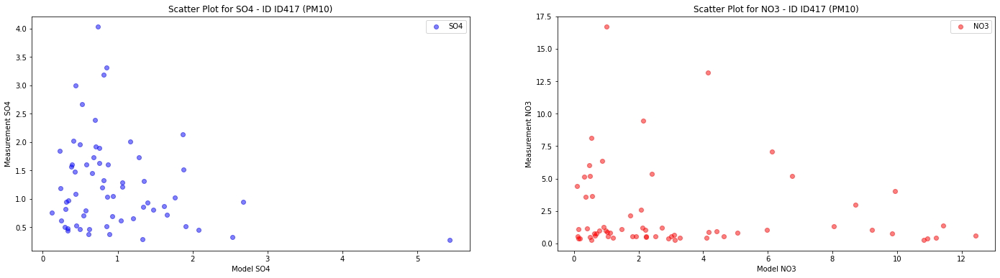

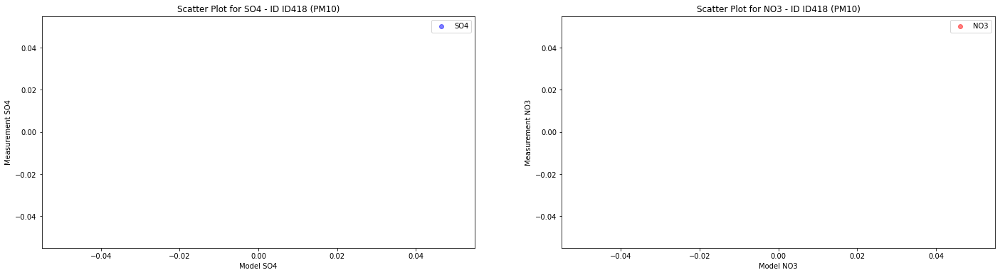

/var/folders/fs/9hkffwc95yz53x44d27zb2ym0000gn/T/ipykernel_21207/1045416388.py:26: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]


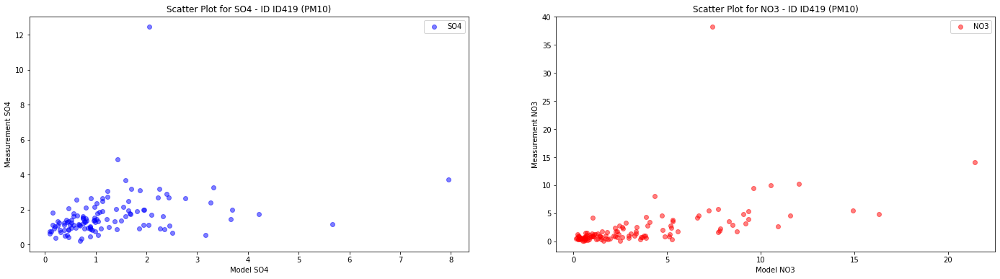

/var/folders/fs/9hkffwc95yz53x44d27zb2ym0000gn/T/ipykernel_21207/1045416388.py:26: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]


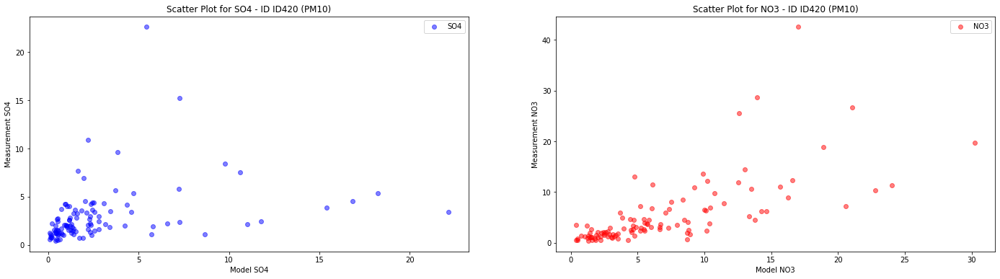

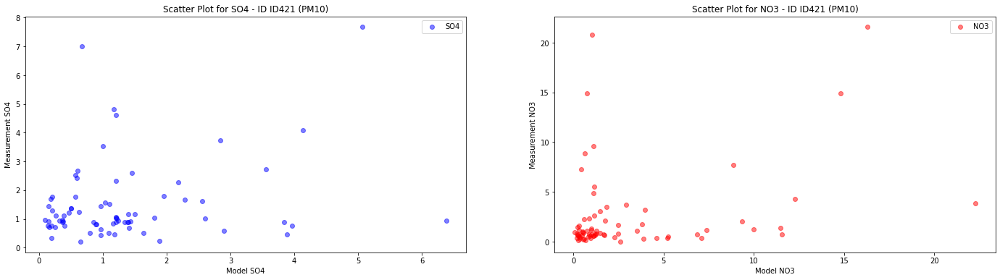

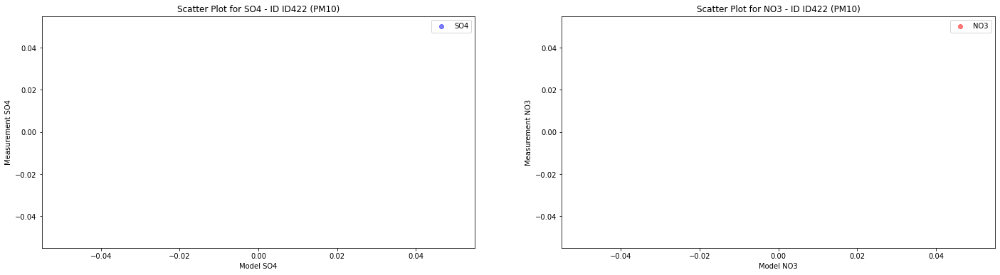

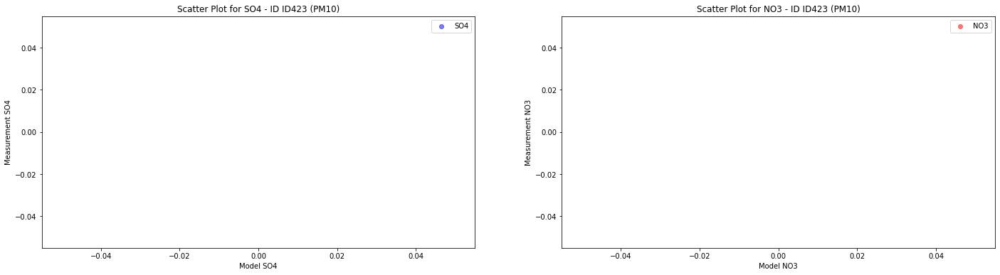

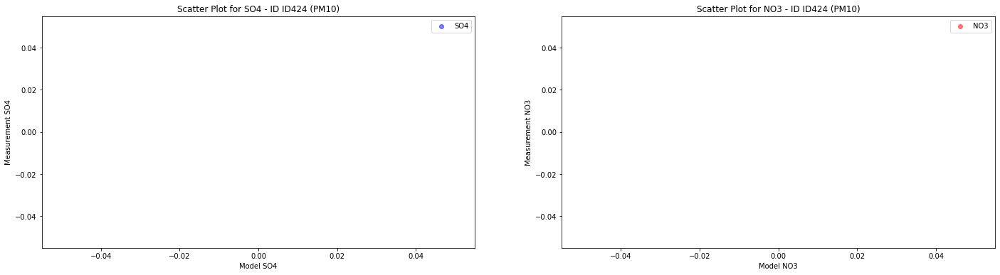

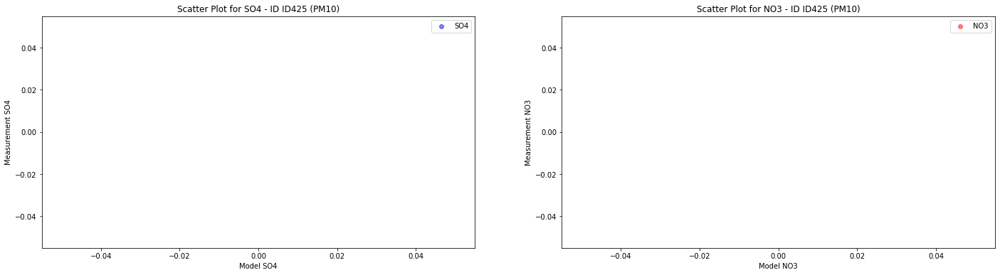

/var/folders/fs/9hkffwc95yz53x44d27zb2ym0000gn/T/ipykernel_21207/1045416388.py:26: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]


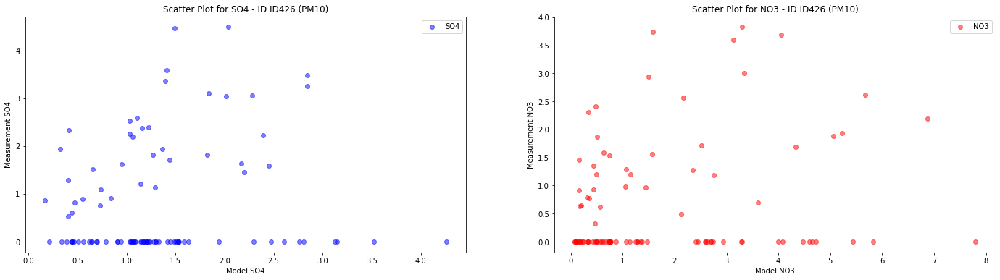

/var/folders/fs/9hkffwc95yz53x44d27zb2ym0000gn/T/ipykernel_21207/1045416388.py:26: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]


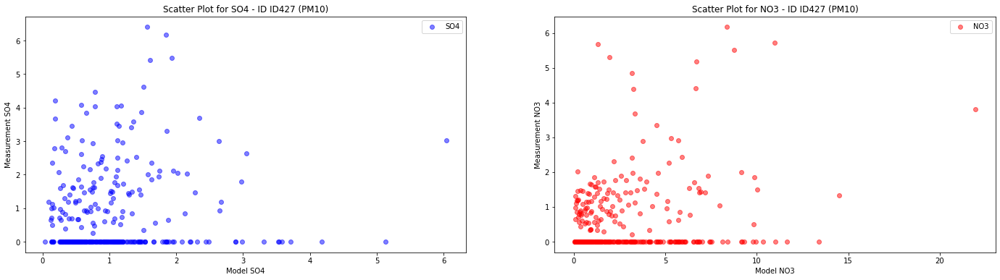

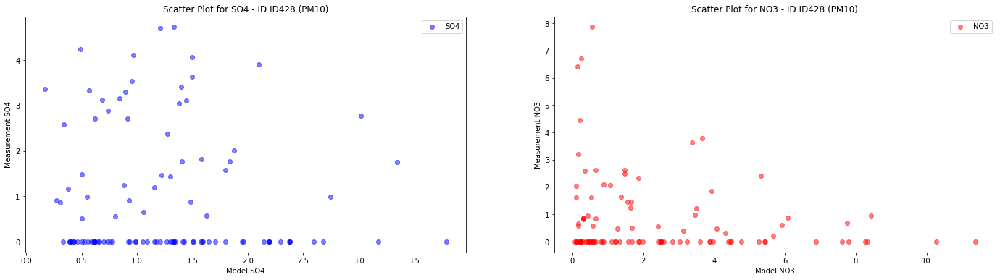

/var/folders/fs/9hkffwc95yz53x44d27zb2ym0000gn/T/ipykernel_21207/1045416388.py:26: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]


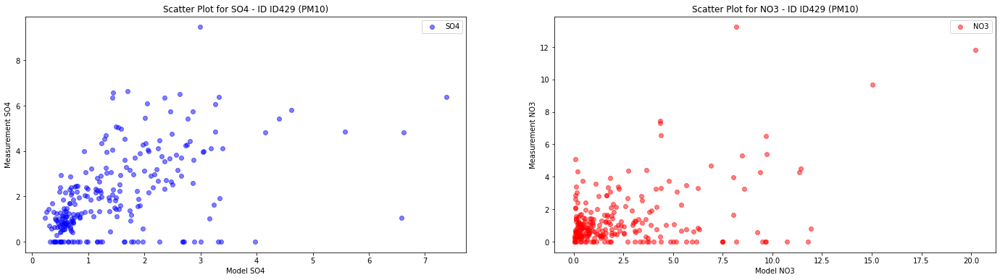

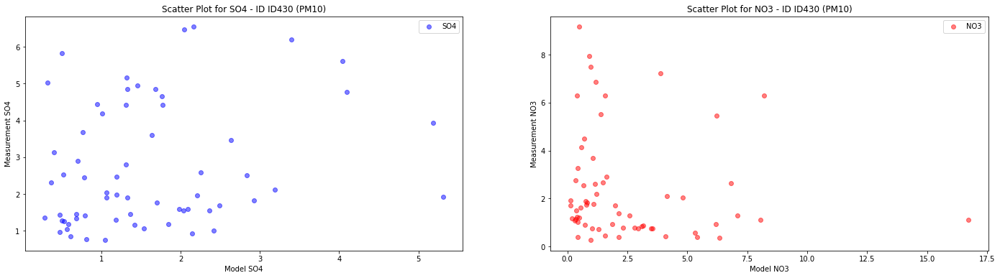

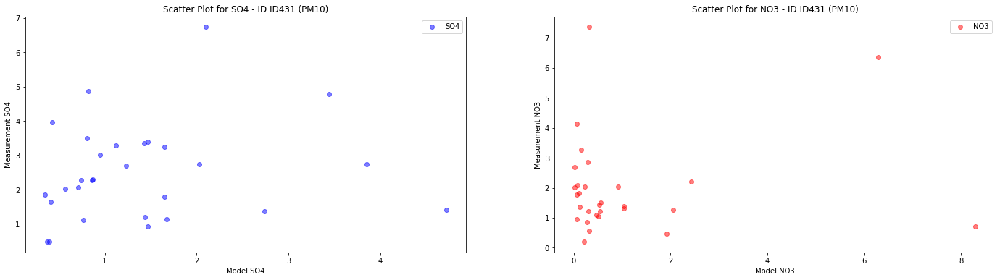

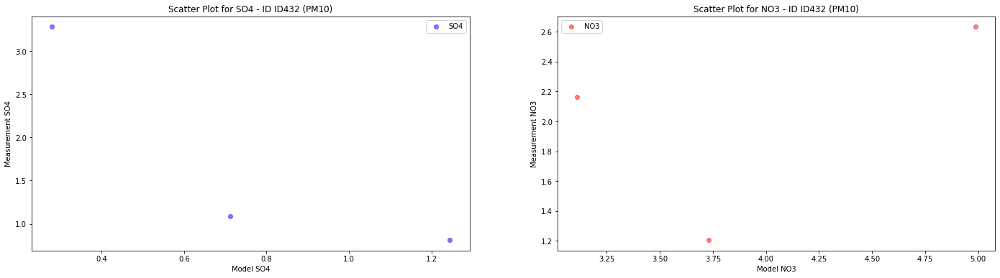

/var/folders/fs/9hkffwc95yz53x44d27zb2ym0000gn/T/ipykernel_21207/1045416388.py:26: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]


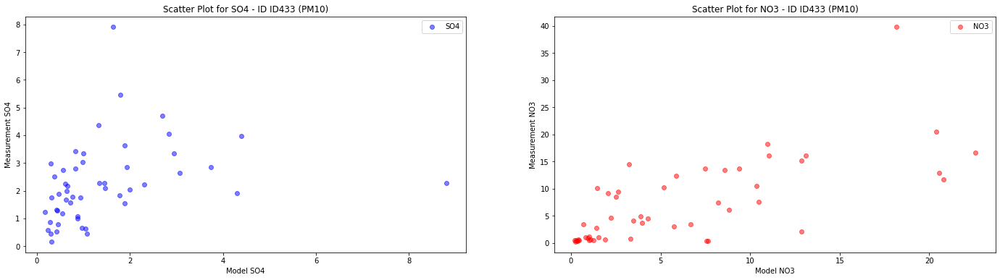

/var/folders/fs/9hkffwc95yz53x44d27zb2ym0000gn/T/ipykernel_21207/1045416388.py:26: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]


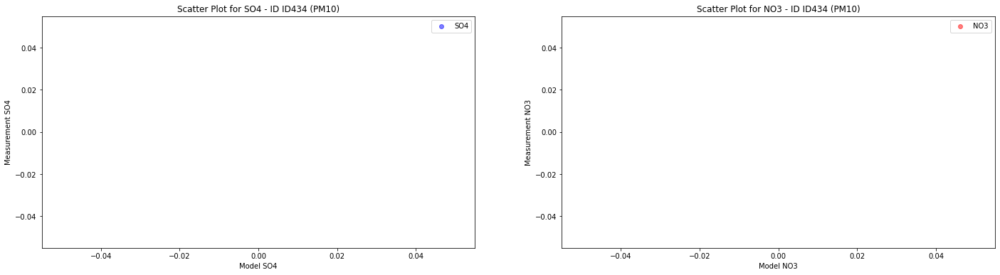

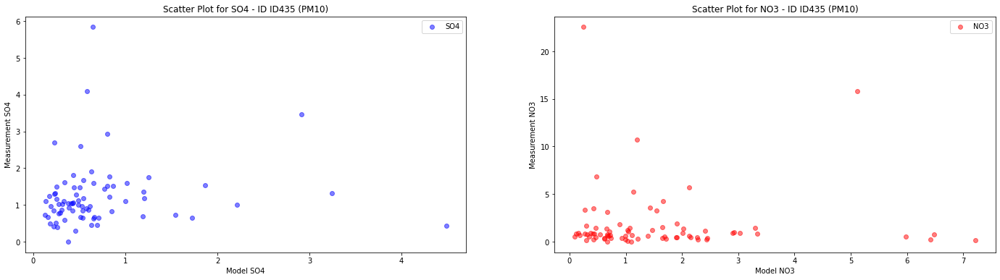

/var/folders/fs/9hkffwc95yz53x44d27zb2ym0000gn/T/ipykernel_21207/1045416388.py:26: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]


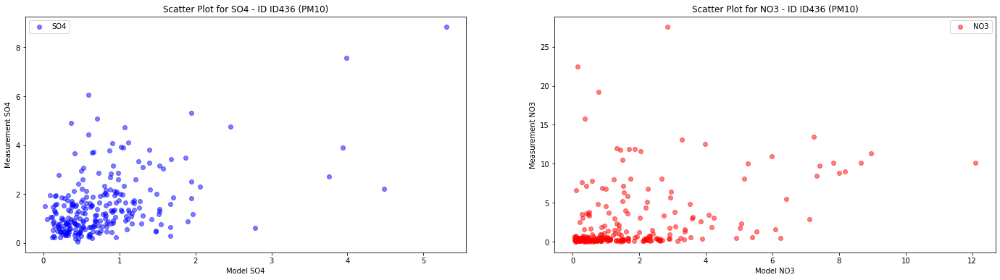

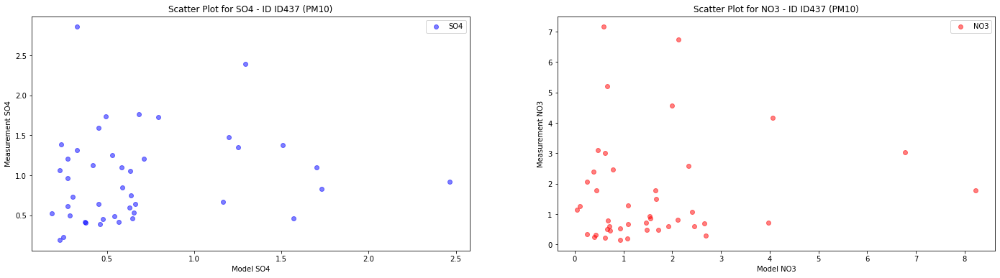

/var/folders/fs/9hkffwc95yz53x44d27zb2ym0000gn/T/ipykernel_21207/1045416388.py:26: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]


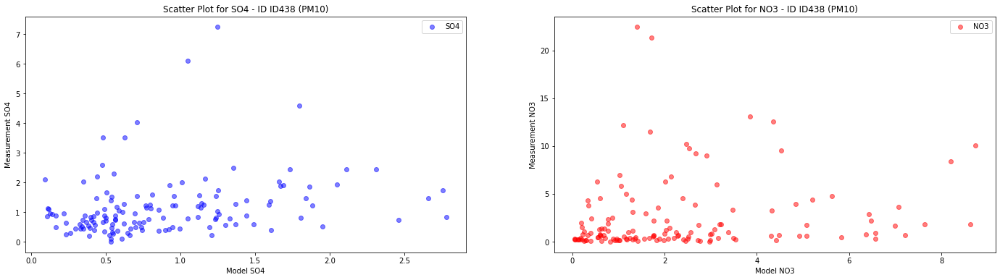

/var/folders/fs/9hkffwc95yz53x44d27zb2ym0000gn/T/ipykernel_21207/1045416388.py:26: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_sheet['Date'] = pd.to_datetime(df_sheet['Date'], errors='coerce')  # Convert to datetime64[ns]


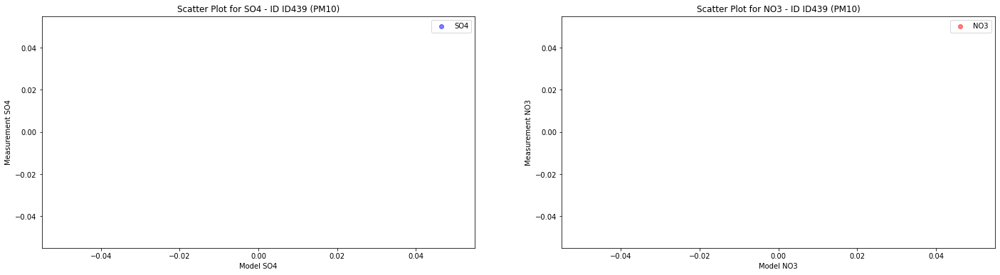

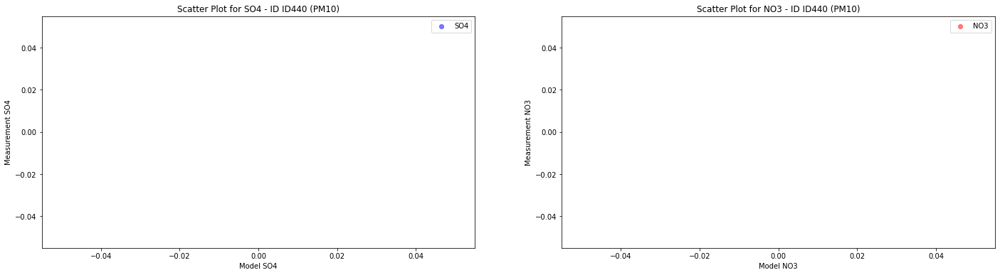

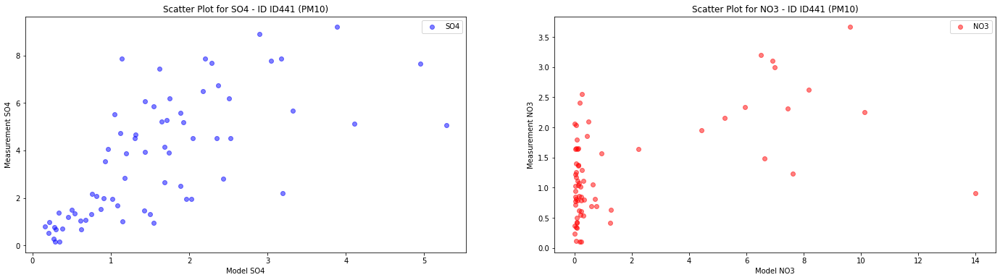

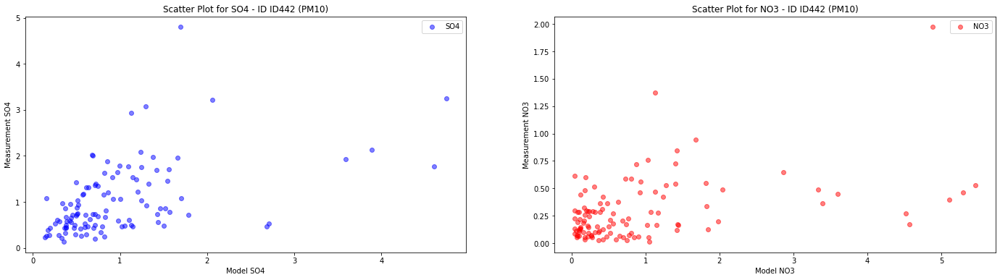

In [18]:
plot_scatter_plots('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/FRANCE_JL_IONS_CONSOLIDATED_new.xlsx')

# Germany

In [19]:
plot_time_series('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/GERMANY_CONSOLIDATED_FINAL.xlsx')

In [20]:
plot_scatter_plots('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/GERMANY_CONSOLIDATED_FINAL.xlsx')

# Greece

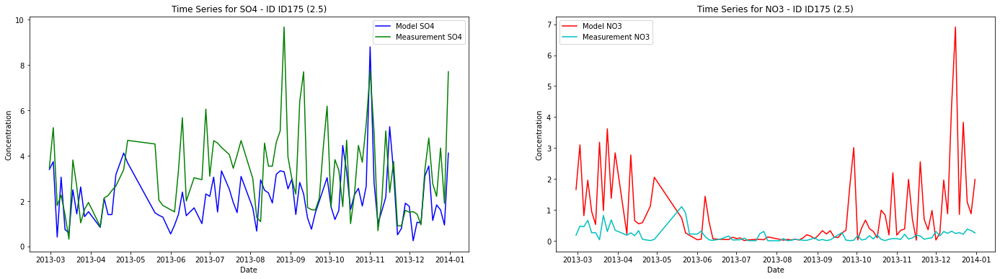

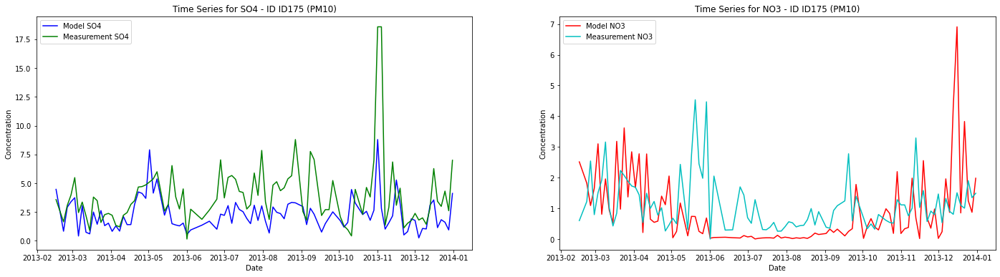

In [21]:
plot_time_series('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/GREECE_CONSOLIDATED_WITH_ACSM_new.xlsx')

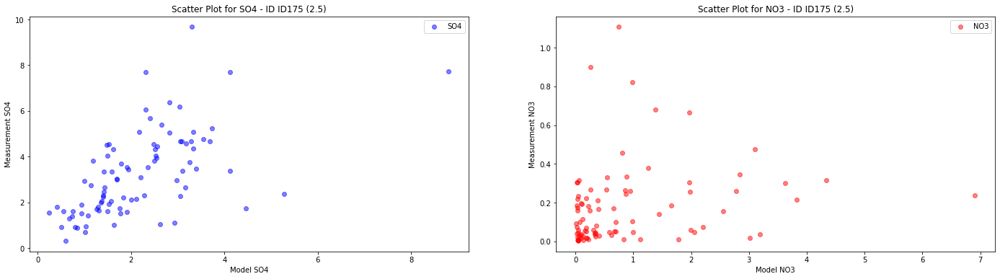

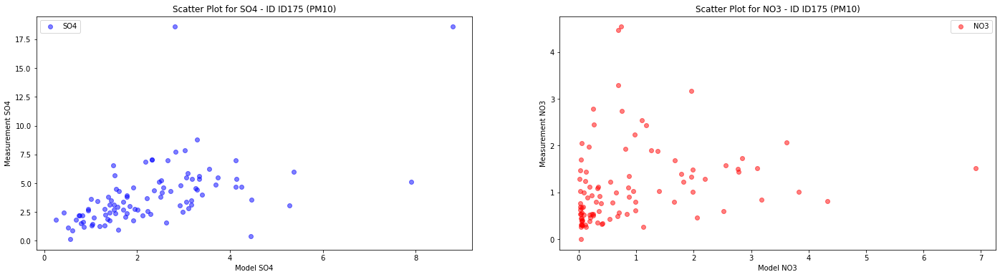

In [22]:
plot_scatter_plots('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/GREECE_CONSOLIDATED_WITH_ACSM_new.xlsx')

# Misc

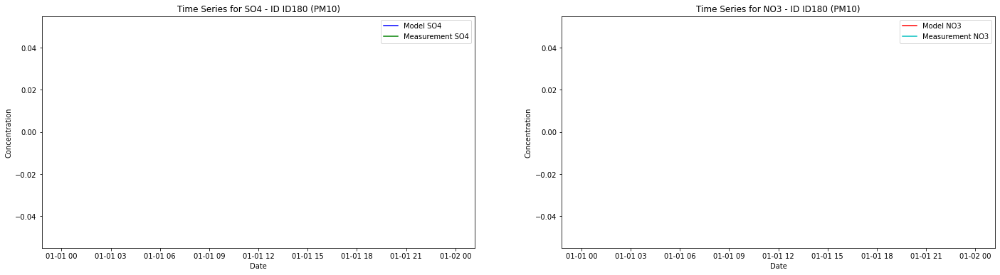

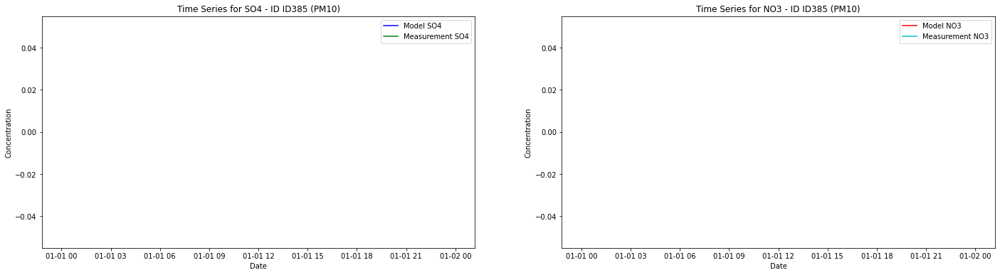

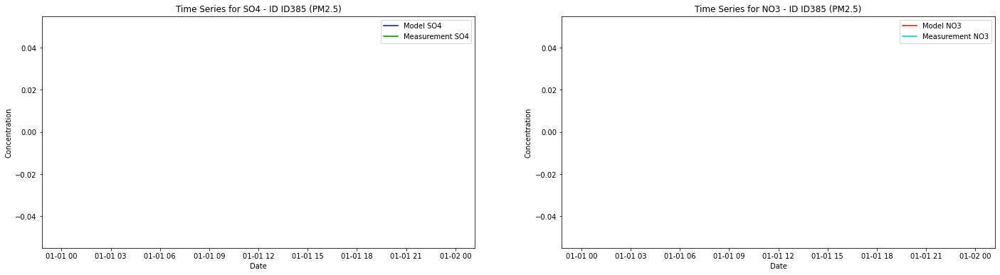

In [23]:
plot_time_series('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/MISC_CONSOLIDATED_15_09_2023_new.xlsx')

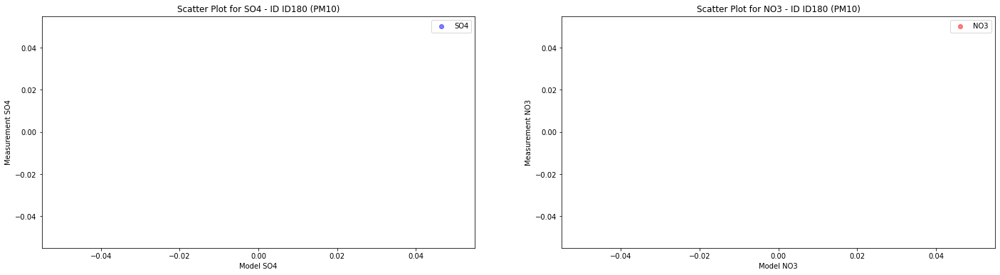

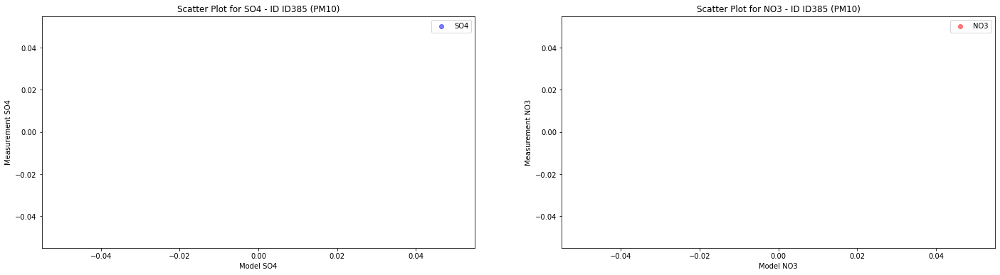

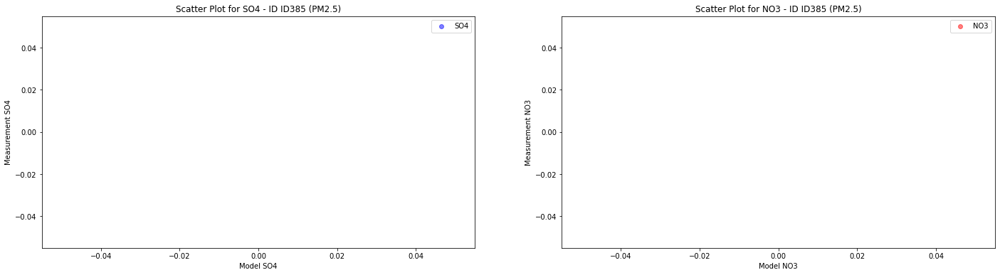

In [24]:
plot_scatter_plots('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/MISC_CONSOLIDATED_15_09_2023_new.xlsx')

# Portugal

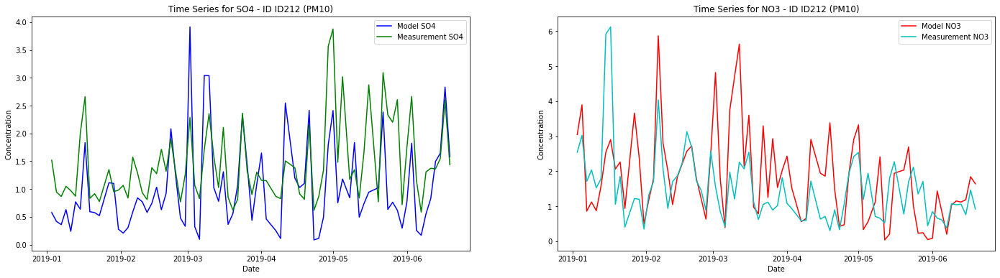

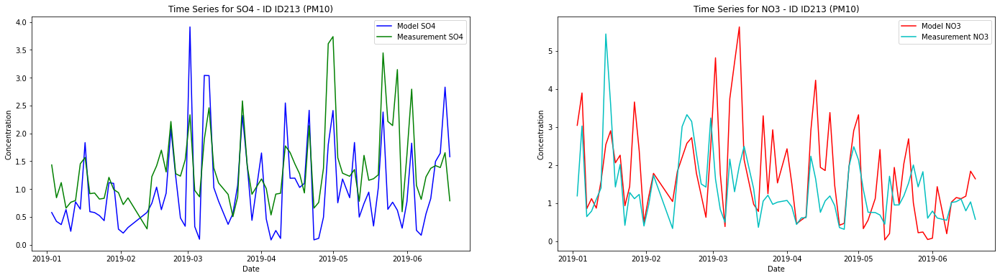

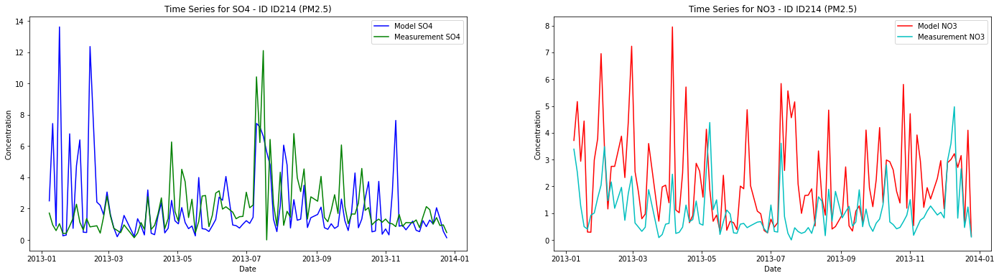

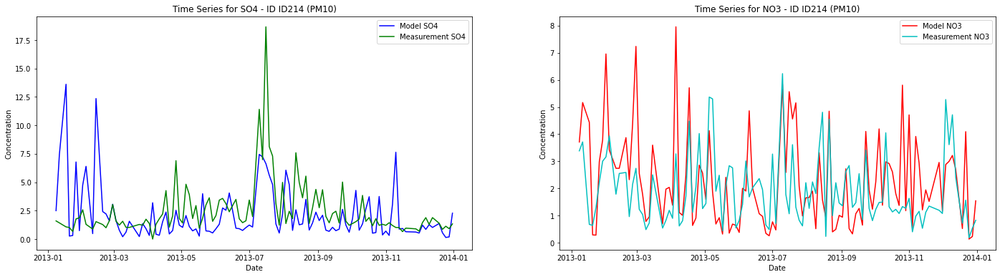

In [25]:
plot_time_series('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/PORTUGAL_CONSOLIDATED.xlsx')

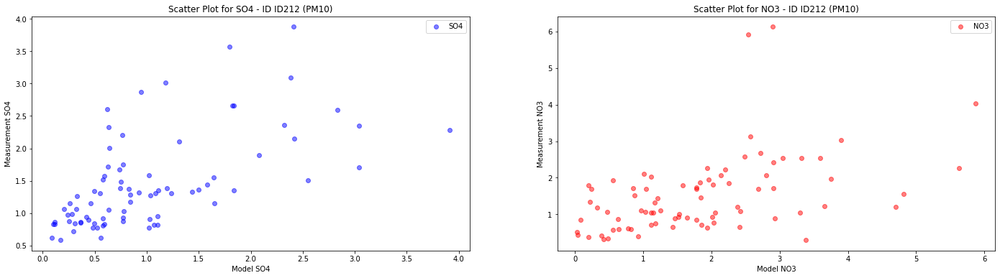

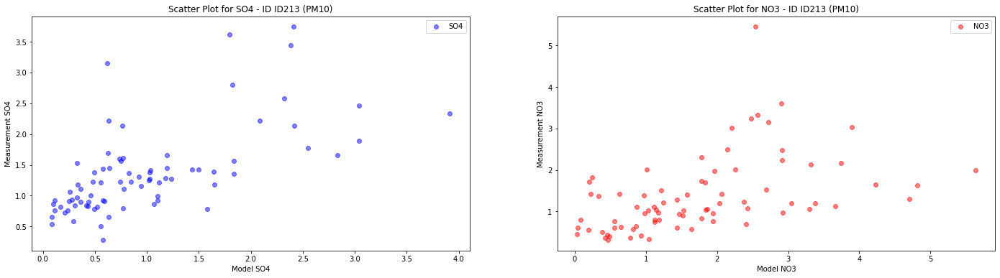

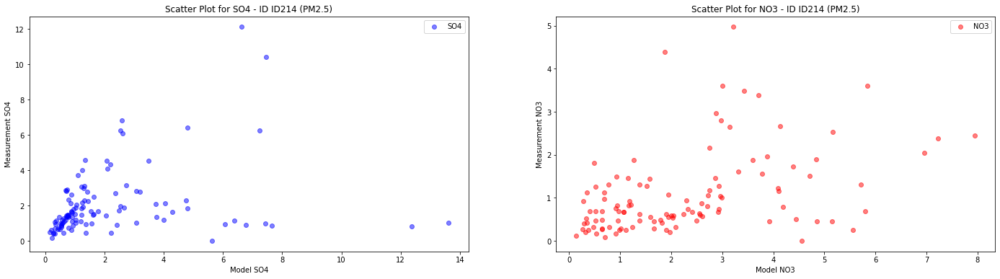

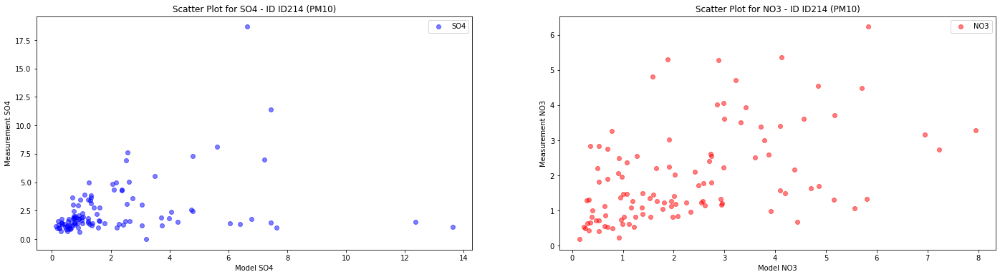

In [26]:
plot_scatter_plots('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/PORTUGAL_CONSOLIDATED.xlsx')

# Slovenia

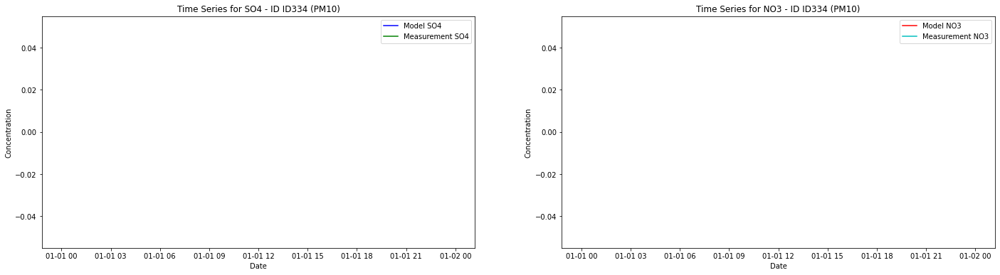

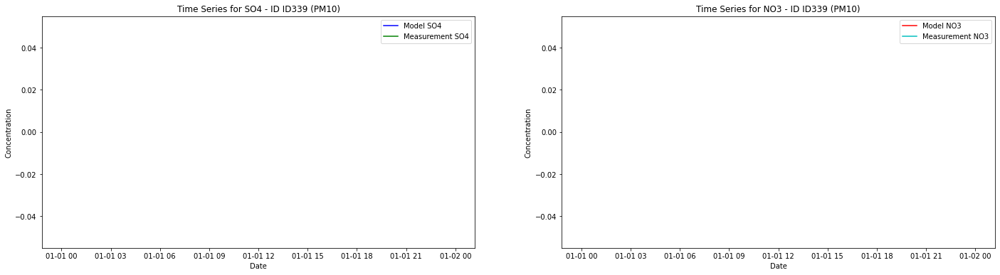

In [27]:
plot_time_series('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/SLOVENIA_CONSOLIDATED.xlsx')

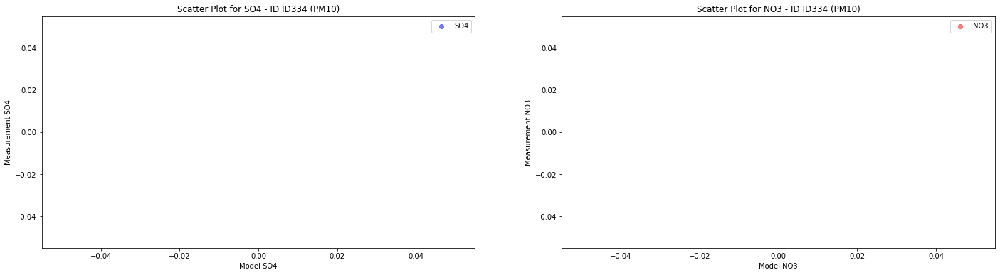

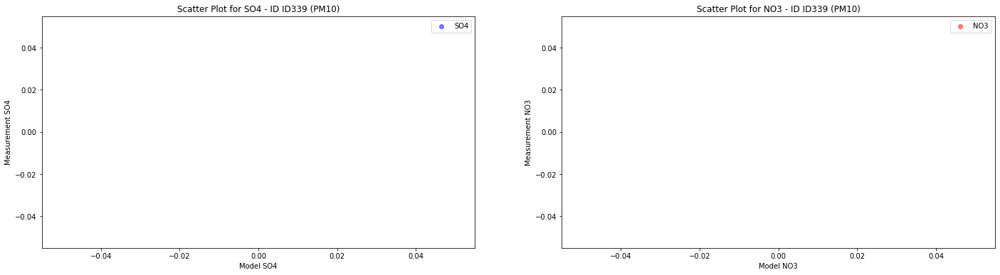

In [28]:
plot_scatter_plots('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/SLOVENIA_CONSOLIDATED.xlsx')

# Spain

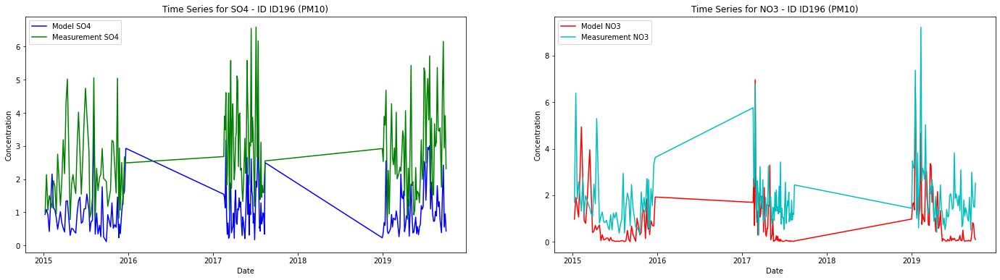

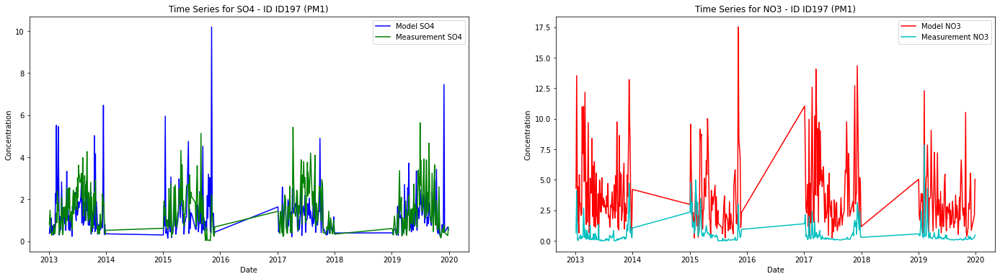

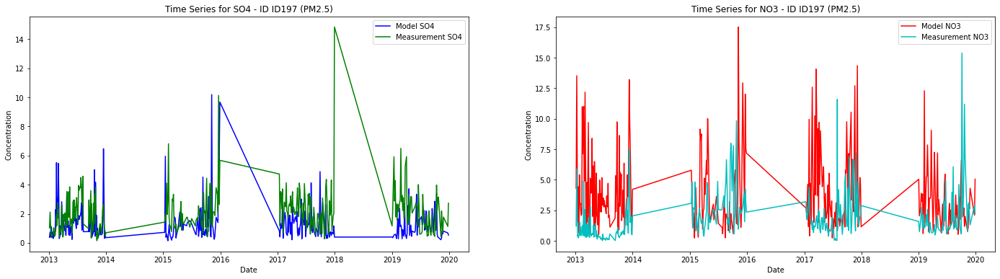

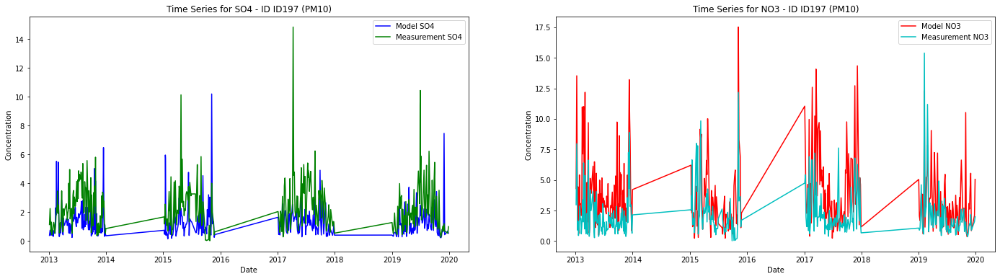

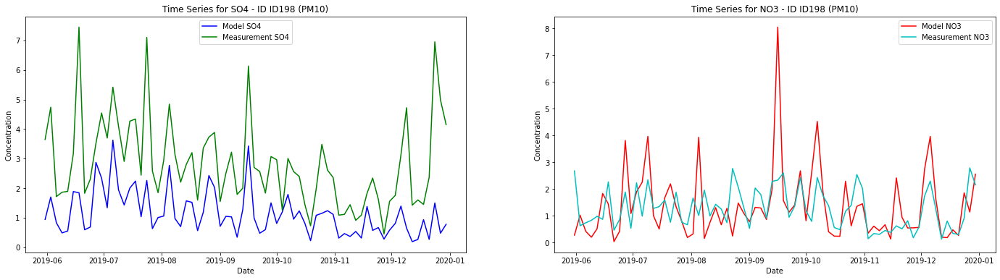

...

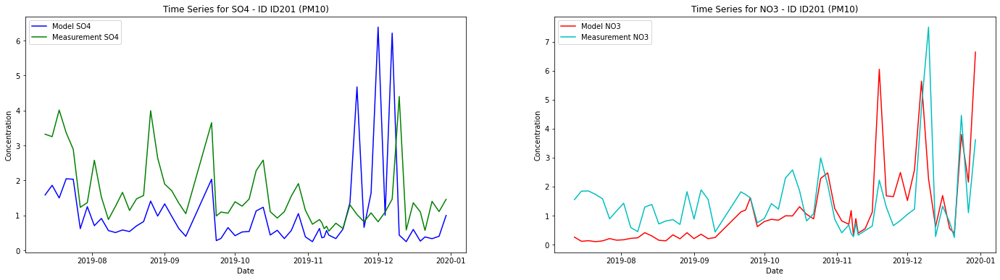

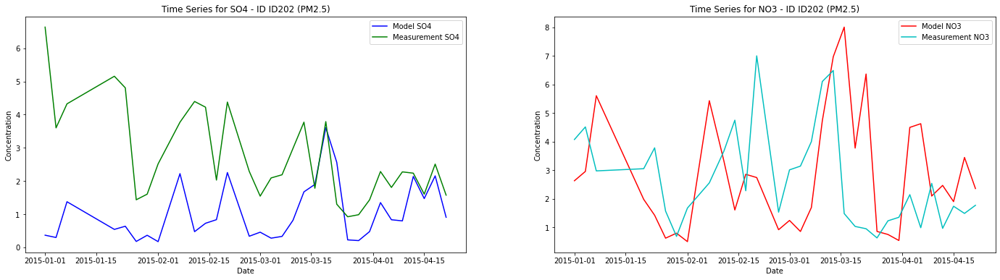

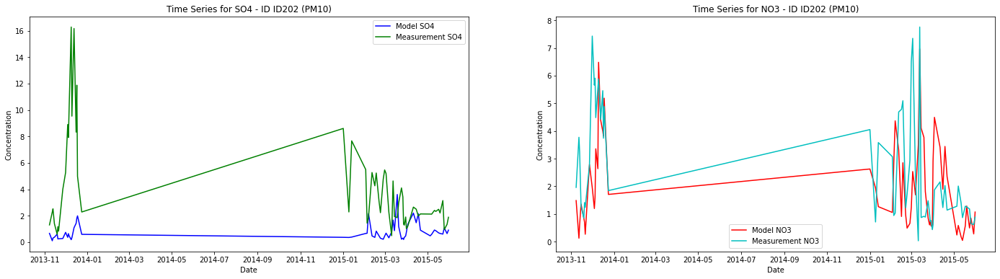

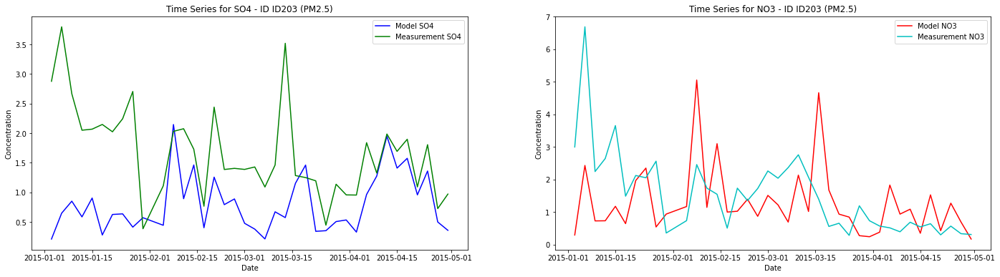

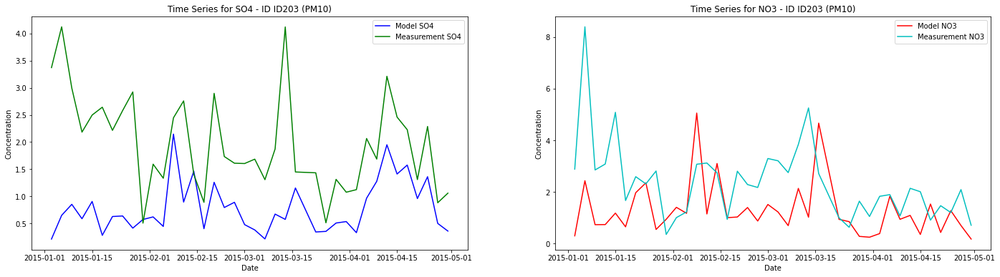

In [29]:
plot_time_series('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/SPAIN_CONSOLIDATED.xlsx')

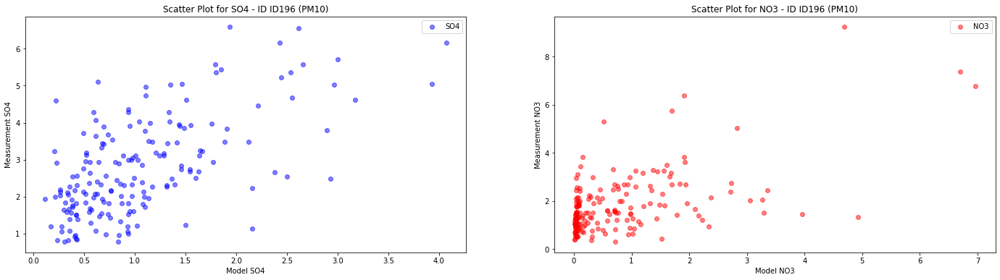

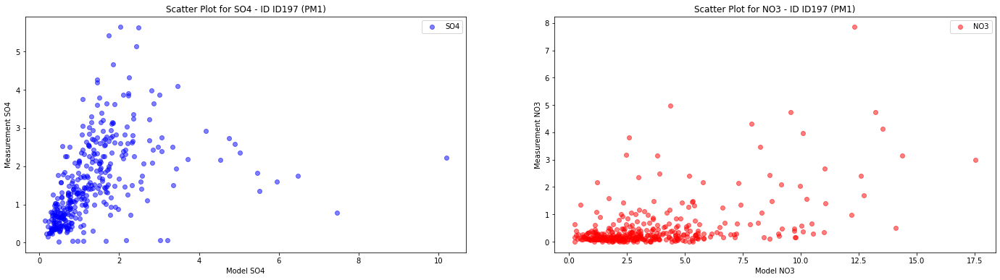

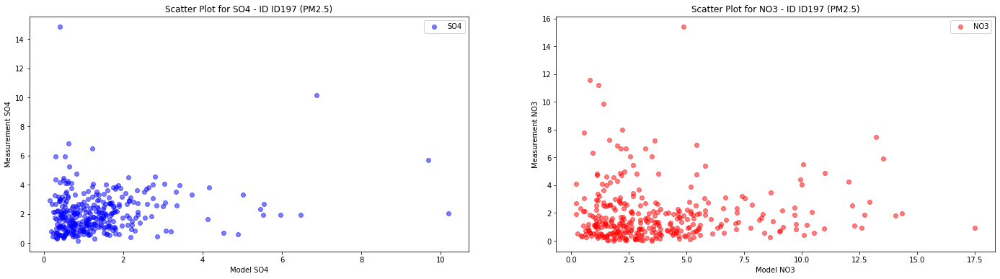

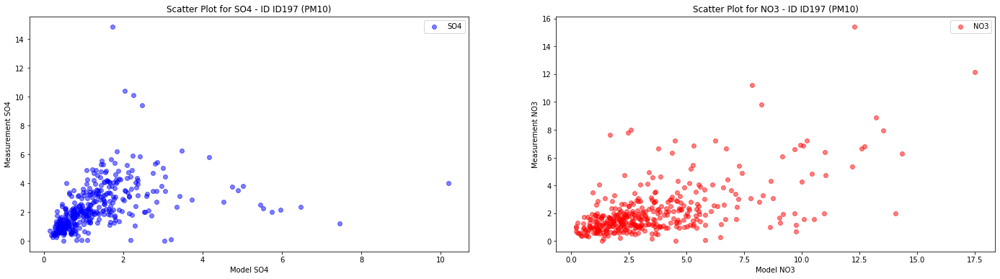

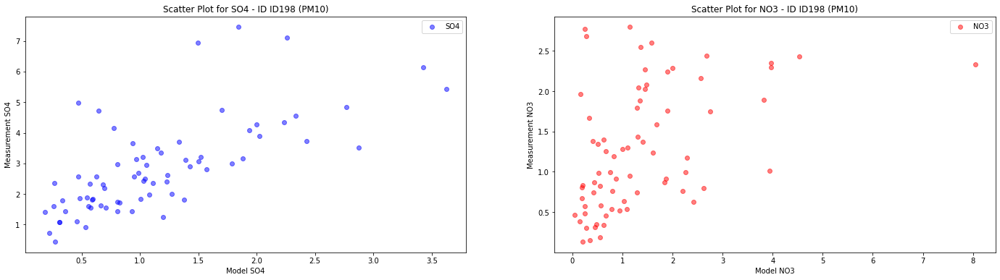

...

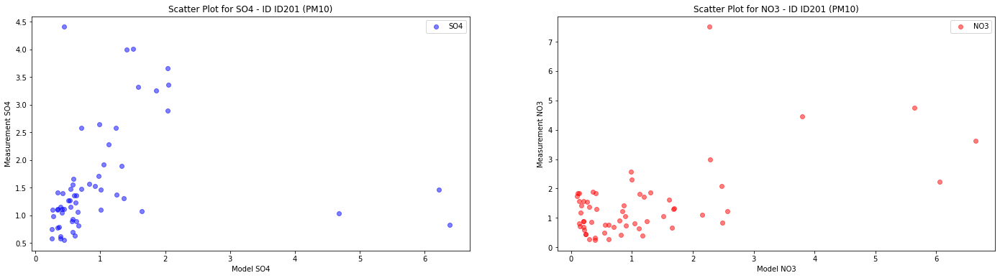

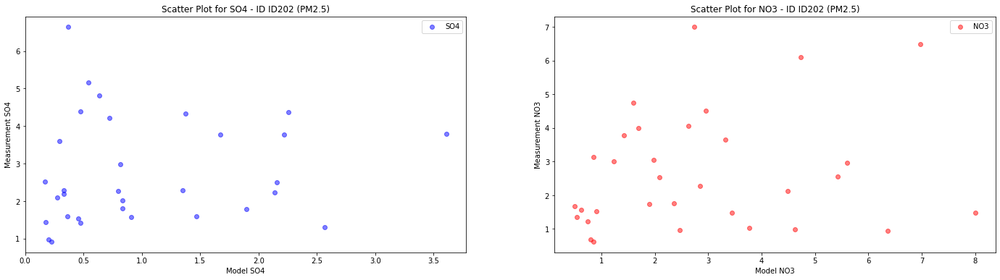

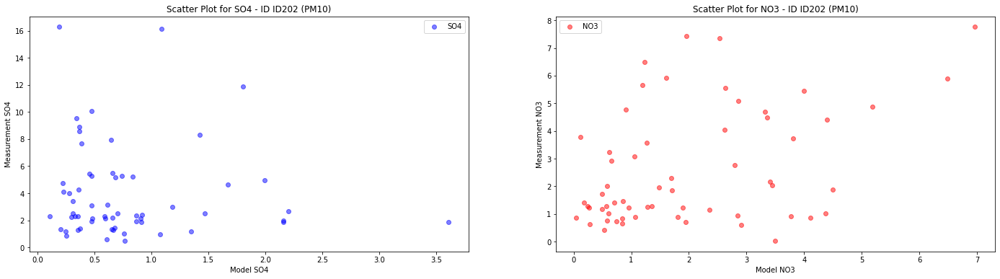

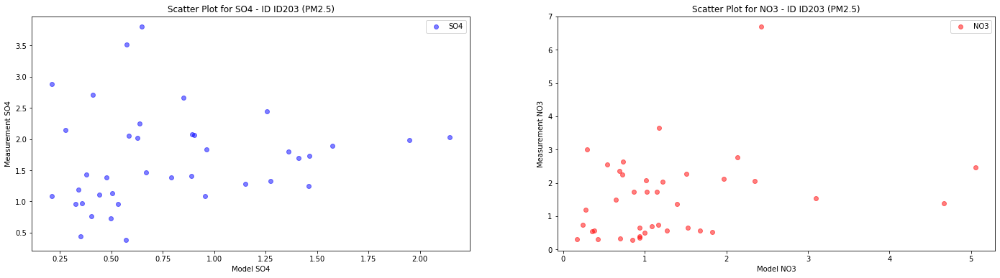

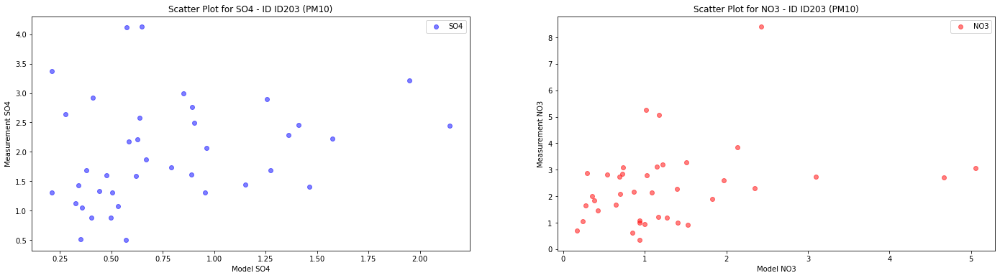

In [30]:
plot_scatter_plots('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/SPAIN_CONSOLIDATED.xlsx')

# Switzerland

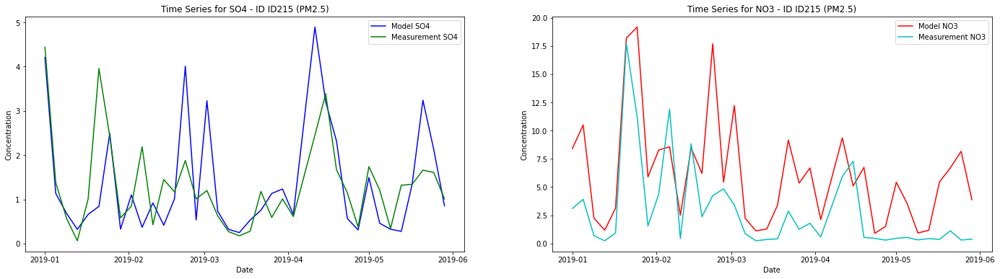

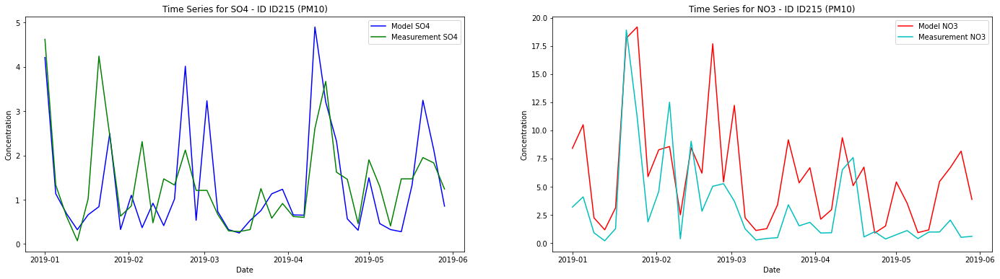

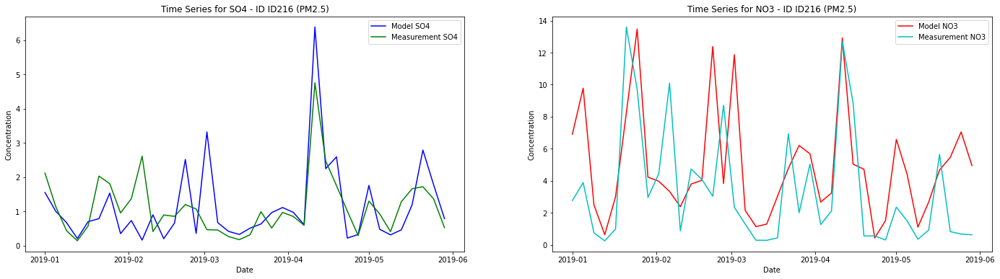

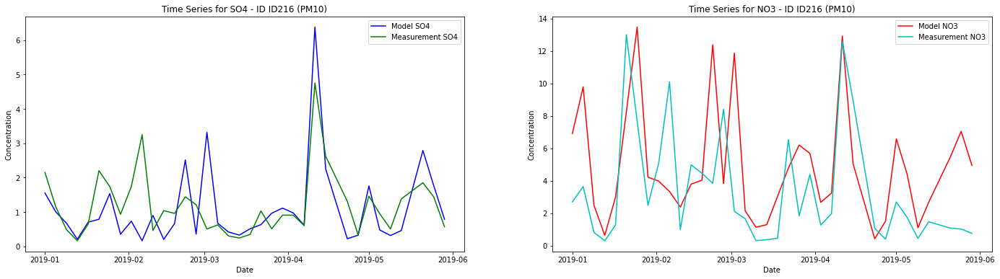

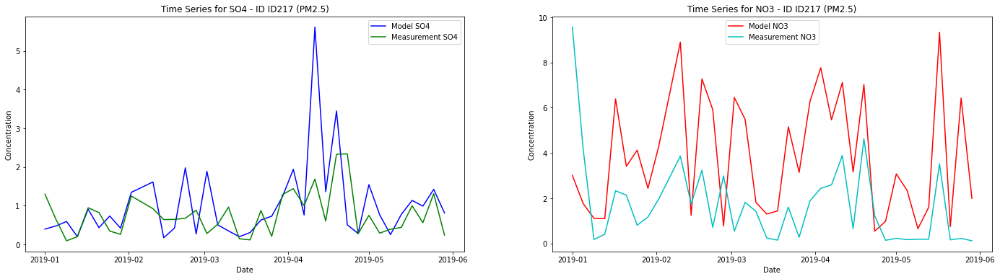

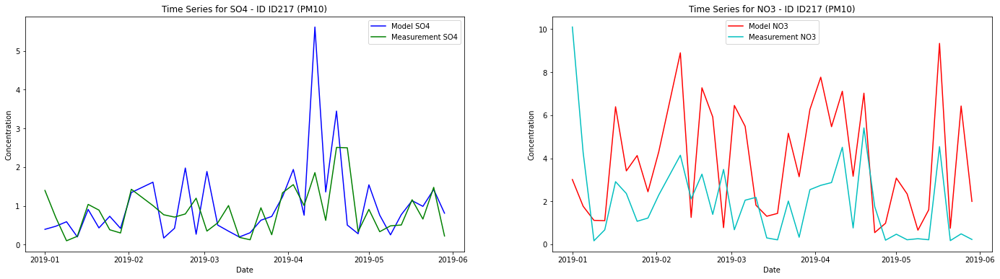

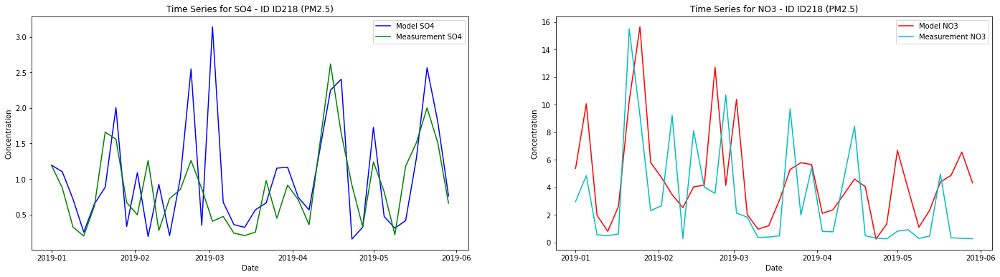

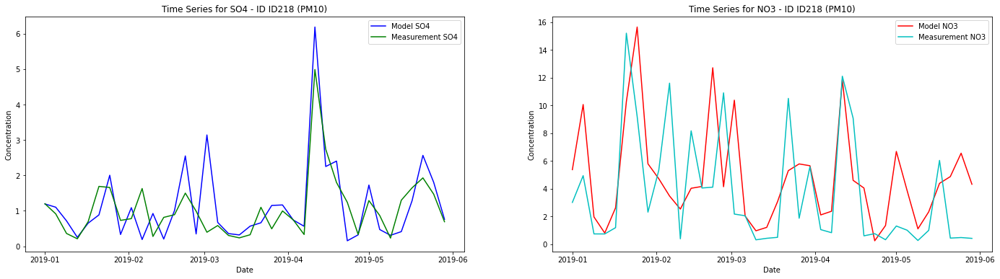

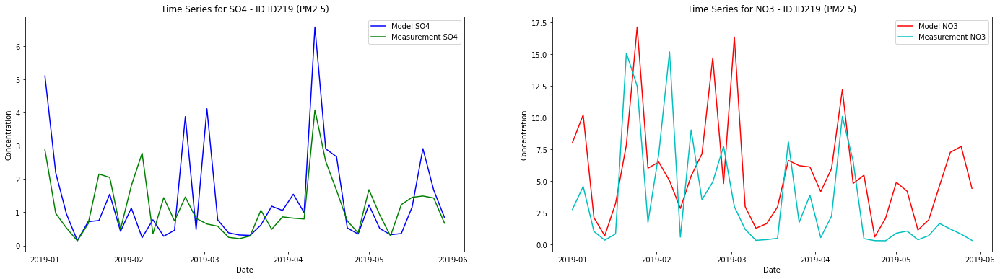

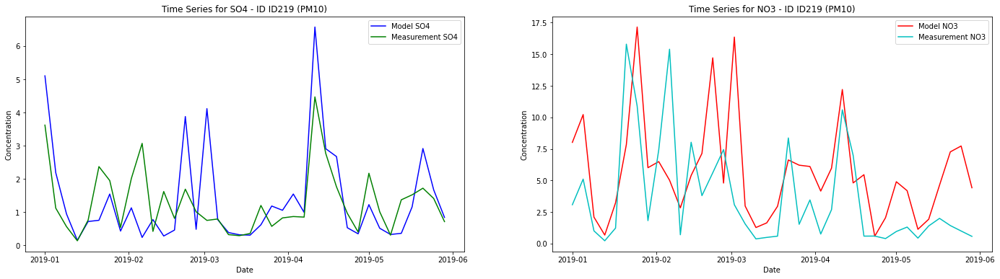

In [32]:
plot_time_series('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/SWITZERLAND_CONSOLIDATED_new.xlsx')

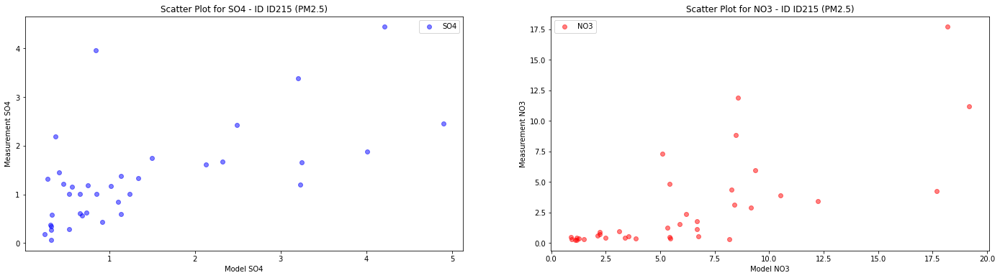

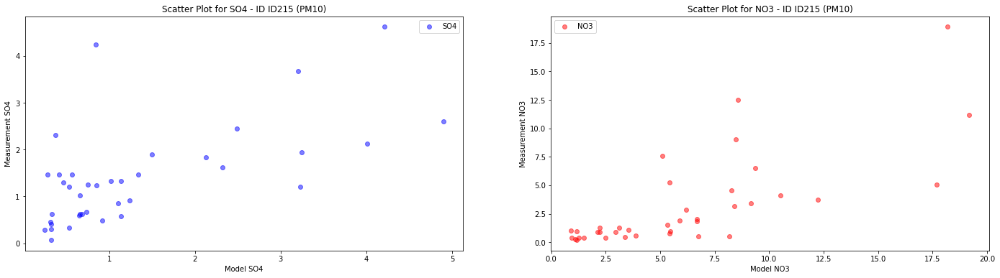

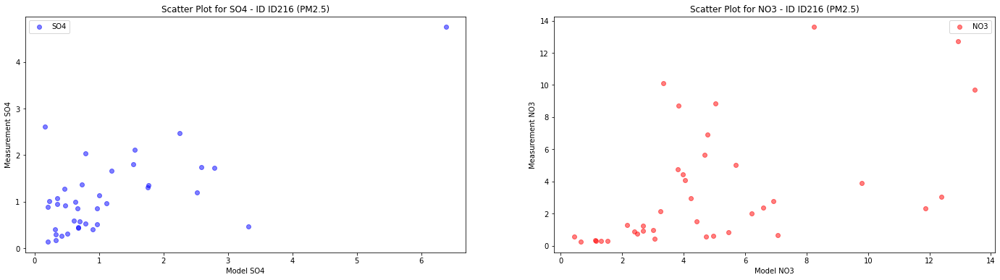

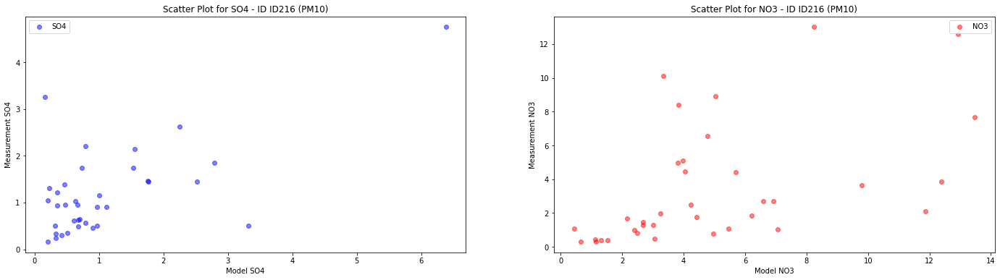

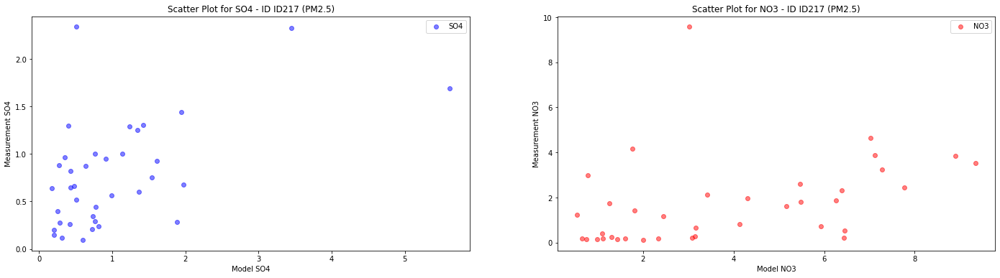

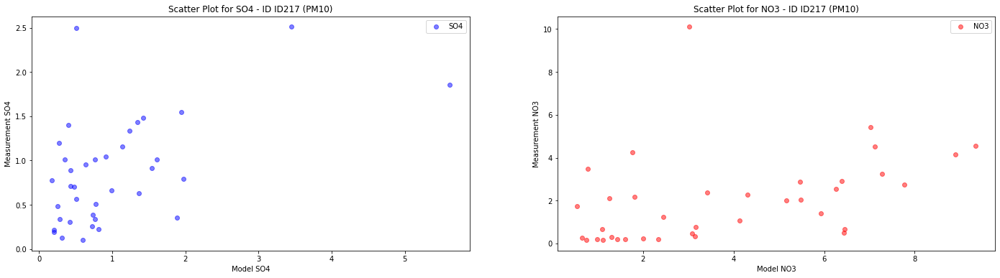

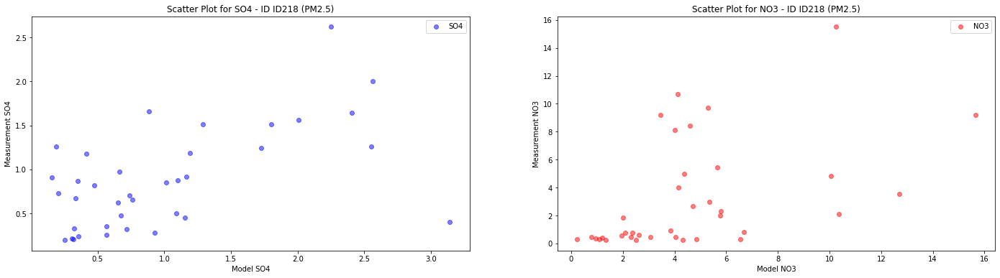

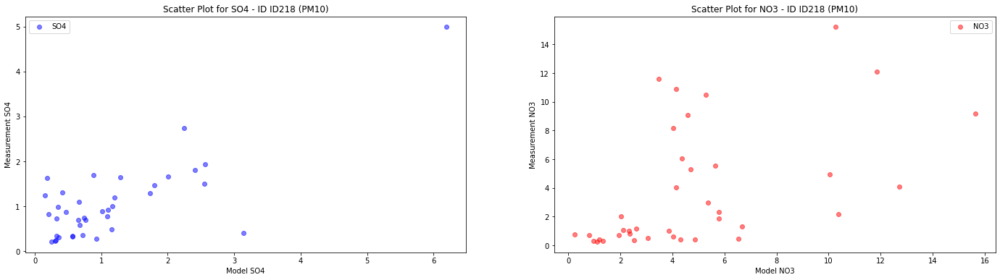

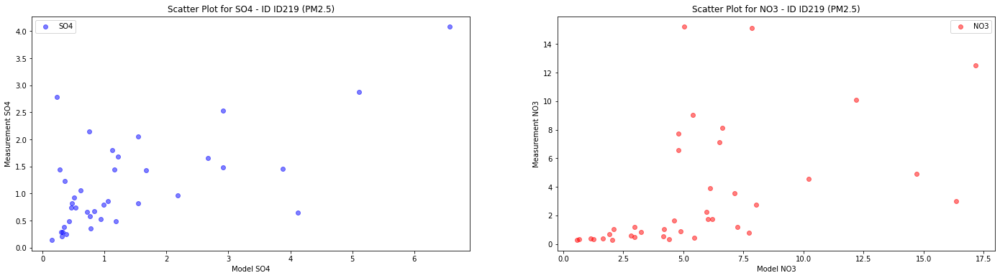

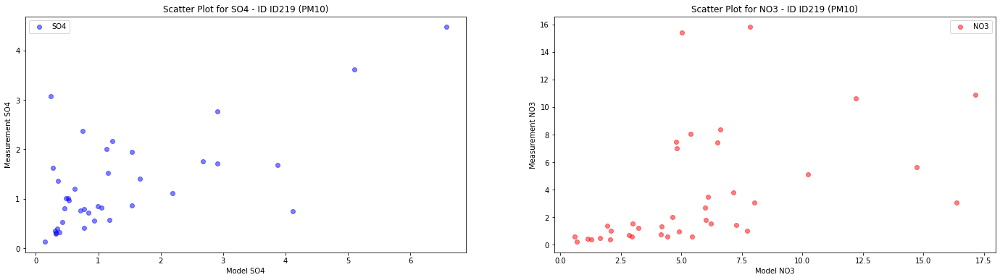

In [33]:
plot_scatter_plots('parquet_to_csv.csv','/Users/defne/Desktop/Current_data_subset/SWITZERLAND_CONSOLIDATED_new.xlsx')